## Import neccessary library

In [2]:
import pandas as pd
import numpy as np
from textblob import TextBlob
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
import plotly.express as px 
from scipy import stats
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', None) 

## Load Dataset

In [3]:
#Here i am loading the data in to the python

In [4]:
df1 = pd.read_csv(r"C:\Users\Dell\Desktop\housing_data.csv")

In [5]:
df1

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,Dec,2008,WD,Normal,250000
5,5,SC50,RL,85,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NaN,0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,No,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,No,MnPrv,Shed,700,Oct,2009,WD,Normal,143000
6,6,SC20,RL,75,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,No,No,No,0,Aug,2007,WD,Normal,307000
7,7,SC60,RL,0,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,No,No,Shed,350,Nov,2009,WD,Normal,200000
8,8,SC50,RM,51,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NaN,0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,No,No,No,0,Apr,2008,WD,Abnorml,129900
9,9,SC190,RL,50,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,

## Sanity check of data

In [6]:
df1.shape

(1460, 81)

In [7]:
#info means it returns all information about the dataframe
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   int64  
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [8]:
#finding the missing value in percentage of each column
total = df1.isnull().sum().sort_values(ascending = False)
percent = (df1.isnull().sum()/df1.shape[0]*100).round(2).sort_values(ascending = False)
pd.concat([total, percent], axis=1, keys=['Total null value ', 'Percentage of null value'])

,Total null value,Percentage of null value
Alley,1369,93.77
MasVnrType,872,59.73
GarageYrBlt,81,5.55
Electrical,1,0.07
KitchenAbvGr,0,0.00
GarageType,0,0.00
FireplaceQu,0,0.00
Fireplaces,0,0.00
Functional,0,0.00
TotRmsAbvGrd,0,0.00


In [9]:
#finding duplicate value of entire data
df1.duplicated().sum()

0

In [10]:
#identify garbage value
for i in df1.select_dtypes(include='object').columns:
    print(df1[i].value_counts())
    print("***"*5)

MSSubClass
SC20     536
SC60     299
SC50     144
SC120     87
SC30      69
SC160     63
SC70      60
SC80      58
SC90      52
SC190     30
SC85      20
SC75      16
SC45      12
SC180     10
SC40       4
Name: count, dtype: int64
***************
MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64
***************
Street
Pave    1454
Grvl       6
Name: count, dtype: int64
***************
Alley
Grvl    50
Pave    41
Name: count, dtype: int64
***************
LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64
***************
LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: count, dtype: int64
***************
Utilities
AllPub    1459
NoSeWa       1
Name: count, dtype: int64
***************
LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: count, dtype: int64
***************
LandSlope
Gtl    1382
Mod      65
Sev      13
Name: count, dtype:

In [11]:
#finding columns of entire data
df1.columns

Index(['Unnamed: 0', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'Pa

# Feature Engineering
In machine learning feature is a measurable characteristic of data that is used as input to a model.
Features are also known as variables or attributes. 

### Missing Value Treatments

In [12]:
#choose the method of imputing missing value
#like mean,median,mode or Knn imputer

In [13]:
#here fill the null value of "GarageYrBlt" column by median() function
for i in ["GarageYrBlt"]:
    df1[i].fillna(df1[i].median(),inplace= True) 

In [14]:
#here fill the null value of "Electrical" column by mode() function
for i in ["Electrical"]:
    df1[i].fillna(df1[i].mode()[0],inplace= True)

### Treatments with columns

In [15]:
#here i am merge the column 'MoSold' & 'YrSold'
df1['MoYrSold'] = df1['MoSold'].astype(str) + "-" + df1['YrSold'].astype(str)

In [16]:
#here change the dtype column of saleprice int to float
df1['SalePrice'] = df1['SalePrice'].astype(float)

#here change the dtype column of GarageYrBlt float to int
df1['GarageYrBlt'] = df1['GarageYrBlt'].astype(int)

In [17]:
#here i am change the datatype for'moyrsold' column to date format
df1['MoYrSold'] = pd.to_datetime(df1['MoYrSold'], format='%b-%Y')

In [18]:
#here i am create price_per_sqrt and age_of_property column
df1['PricePerSqFt'] = df1['SalePrice']/df1['LotArea']

# Calculate age of the house
df1['HouseAge'] = 2025 - df1['YearBuilt']

In [19]:
#Create the 'TotalSF' column
df1['TotalSF'] = df1['1stFlrSF'] + df1['2ndFlrSF']

print(df1[['1stFlrSF', '2ndFlrSF', 'TotalBsmtSF', 'TotalSF']].head())

   1stFlrSF  2ndFlrSF  TotalBsmtSF  TotalSF
0       856       854          856     1710
1      1262         0         1262     1262
2       920       866          920     1786
3       961       756          756     1717
4      1145      1053         1145     2198


In [20]:
# Create new columns for BsmtTotalBath and TotalBath
df1['BsmtTotalBath'] = (df1['BsmtFullBath'] + df1['BsmtHalfBath'] / 2).astype(int)
df1['TotalBath'] = (df1['FullBath'] + df1['HalfBath'] / 2).astype(int)

print(df1[['FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 'BsmtTotalBath', 'TotalBath']].head())

   FullBath  HalfBath  BsmtFullBath  BsmtHalfBath  BsmtTotalBath  TotalBath
0         2         1             1             0              1          2
1         2         0             0             1              0          2
2         2         1             1             0              1          2
3         1         0             1             0              1          1
4         2         1             1             0              1          2


In [21]:
#here i am delete some column Alley column has been deleted because it contains 90% null values.
df2 = df1.drop(columns=['2ndFlrSF','1stFlrSF','Unnamed: 0','Alley','MasVnrType','YearRemodAdd','SaleCondition','Exterior2nd','Condition2','OverallCond','ExterQual','BsmtQual','BsmtFinType1','BsmtFinSF2','BsmtFinSF1','BsmtHalfBath','HalfBath','Functional','Fence','PoolQC','GarageQual','YrSold','MoSold','Utilities','MiscVal','PoolArea','3SsnPorch','ScreenPorch','PoolArea','FullBath','BsmtFullBath','SaleType','EnclosedPorch'], axis=1).rename(columns = {'Condition1':'Condition',
                          'Exterior1st':'Exterior','BsmtFinType2':'BsmtFinType'})

In [22]:
df3 = df2.drop(columns=['RoofMatl','BsmtExposure','FireplaceQu','LotShape'])

In [23]:
df4 = df3.drop(columns=['LandSlope','HeatingQC','LowQualFinSF','GarageFinish'])

In [24]:
#here i am using map function for column value change 
df4['MSSubClass'].value_counts()

MSSubClass
SC20     536
SC60     299
SC50     144
SC120     87
SC30      69
SC160     63
SC70      60
SC80      58
SC90      52
SC190     30
SC85      20
SC75      16
SC45      12
SC180     10
SC40       4
Name: count, dtype: int64

In [25]:
# Create a mapping of the string values to integers
mapping = {'SC60': 60, 'SC20': 20, 'SC70': 70, 'SC50': 50, 'SC45': 45, 'SC190': 190, 'SC90': 90, 'SC120': 120, 'SC30': 30, 'SC80': 80,'SC40': 40, 'SC160':160,'SC85': 85,'SC75': 75,'SC180':180,'SC40': 40}

In [26]:
df4['MSSubClass'] = df4['MSSubClass'].map(mapping)

In [27]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 47 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   MSSubClass     1460 non-null   int64         
 1   MSZoning       1460 non-null   object        
 2   LotFrontage    1460 non-null   int64         
 3   LotArea        1460 non-null   int64         
 4   Street         1460 non-null   object        
 5   LandContour    1460 non-null   object        
 6   LotConfig      1460 non-null   object        
 7   Neighborhood   1460 non-null   object        
 8   Condition      1460 non-null   object        
 9   BldgType       1460 non-null   object        
 10  HouseStyle     1460 non-null   object        
 11  OverallQual    1460 non-null   int64         
 12  YearBuilt      1460 non-null   int64         
 13  RoofStyle      1460 non-null   object        
 14  Exterior       1460 non-null   object        
 15  MasVnrArea     1460 n

In [28]:
df4.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LandContour      0
LotConfig        0
Neighborhood     0
Condition        0
BldgType         0
HouseStyle       0
OverallQual      0
YearBuilt        0
RoofStyle        0
Exterior         0
MasVnrArea       0
ExterCond        0
Foundation       0
BsmtCond         0
BsmtFinType      0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
CentralAir       0
Electrical       0
GrLivArea        0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Fireplaces       0
GarageType       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
GarageCond       0
PavedDrive       0
WoodDeckSF       0
OpenPorchSF      0
MiscFeature      0
SalePrice        0
MoYrSold         0
PricePerSqFt     0
HouseAge         0
TotalSF          0
BsmtTotalBath    0
TotalBath        0
dtype: int64

In [29]:
df4.duplicated().sum()

0

In [30]:
df4.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LandContour', 'LotConfig', 'Neighborhood', 'Condition', 'BldgType',
       'HouseStyle', 'OverallQual', 'YearBuilt', 'RoofStyle', 'Exterior',
       'MasVnrArea', 'ExterCond', 'Foundation', 'BsmtCond', 'BsmtFinType',
       'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'CentralAir', 'Electrical',
       'GrLivArea', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageCars',
       'GarageArea', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'MiscFeature', 'SalePrice', 'MoYrSold', 'PricePerSqFt', 'HouseAge',
       'TotalSF', 'BsmtTotalBath', 'TotalBath'],
      dtype='object')

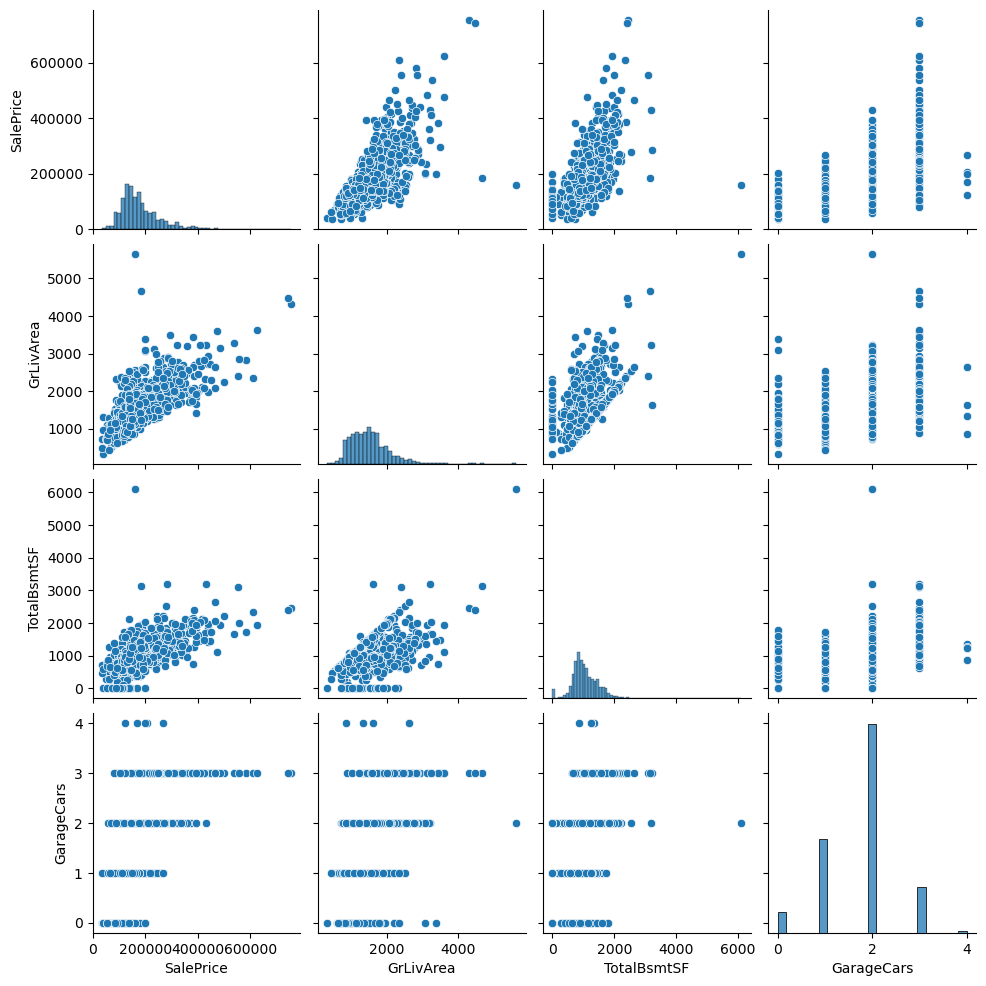

In [31]:
sns.pairplot(df4, vars=['SalePrice', 'GrLivArea', 'TotalBsmtSF', 'GarageCars'])
plt.show()

### 1.SalePrice vs. GrLivArea: There's a positive correlation. As the above-ground living area increases, the sale price tends to increase as well. This is logical because larger living areas are generally more valuable.

2.SalePrice vs. TotalBsmtSF: There's a positive correlation here too. Houses with larger basement areas tend to have higher sale prices.

3.SalePrice vs. GarageCars: The scatter plot shows that houses with more garage cars tend to have higher sale prices, though the relationship is less clear compared to GrLivArea and TotalBsmtSF.

4.GrLivArea vs. TotalBsmtSF: There's a positive correlation, indicating that houses with larger above-ground living areas also tend to have larger basement areas.

5.GrLivArea vs. GarageCars: The scatter plot shows some positive correlation, suggesting that houses with larger living areas tend to have more garage spaces.

6.TotalBsmtSF vs. GarageCars: There's a positive correlation, indicating that houses with larger basement areas tend to have more garage spaces.

# Exploratory Data Analysis(EDA)

In [32]:
#Descriptive Statistics
df4.describe().T

,count,mean,min,25%,50%,75%,max,std
MSSubClass,1460.0,56.89726,20.0,20.0,50.0,70.0,190.0,42.300571
LotFrontage,1460.0,57.623288,0.0,42.0,63.0,79.0,313.0,34.664304
LotArea,1460.0,10516.828082,1300.0,7553.5,9478.5,11601.5,215245.0,9981.264932
OverallQual,1460.0,6.099315,1.0,5.0,6.0,7.0,10.0,1.382997
YearBuilt,1460.0,1971.267808,1872.0,1954.0,1973.0,2000.0,2010.0,30.202904
MasVnrArea,1460.0,103.117123,0.0,0.0,0.0,164.25,1600.0,180.731373
BsmtUnfSF,1460.0,567.240411,0.0,223.0,477.5,808.0,2336.0,441.866955
TotalBsmtSF,1460.0,1057.429452,0.0,795.75,991.5,1298.25,6110.0,438.705324
GrLivArea,1460.0,1515.463699,334.0,1129.5,1464.0,1776.75,5642.0,525.480383
BedroomAbvGr,1460.0,2.866438,0.0,2.0,3.0,3.0,8.0,0.815778


In [33]:
df4.describe(include="object").T

,count,unique,top,freq
MSZoning,1460,5,RL,1151
Street,1460,2,Pave,1454
LandContour,1460,4,Lvl,1311
LotConfig,1460,5,Inside,1052
Neighborhood,1460,25,NAmes,225
Condition,1460,9,Norm,1260
BldgType,1460,5,1Fam,1220
HouseStyle,1460,8,1Story,726
RoofStyle,1460,6,Gable,1141
Exterior,1460,15,VinylSd,515


# outliers Detection

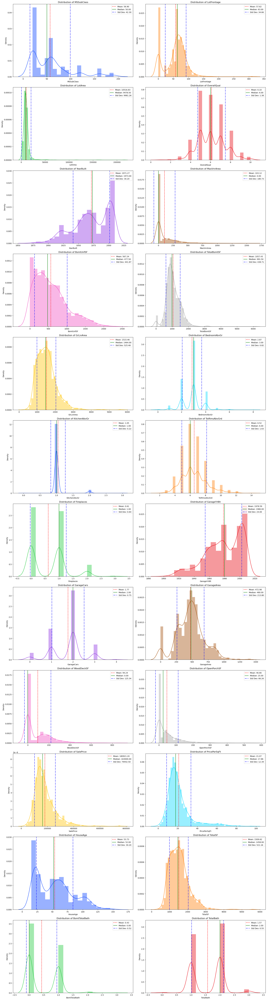

In [34]:
numeric_cols = df4.select_dtypes(include=['float64', 'int64','int32']).columns

plt.figure(figsize=(20, 80))
 
for i, col in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols)//2 + 1, 2, i + 1)
    sns.distplot(df4[col], color=sns.color_palette("bright", len(numeric_cols))[i], kde=True)
    plt.title(f'Distribution of {col}')

    mean = df4[col].mean()
    std_dev = df4[col].std()
    median = df4[col].median()
    plt.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    plt.axvline(median, color='green', linestyle='-', label=f'Median: {median:.2f}')
    plt.axvline(mean + std_dev, color='blue', linestyle='-.', label=f'Std Dev: {std_dev:.2f}')
    plt.axvline(mean - std_dev, color='blue', linestyle='-.')

    plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

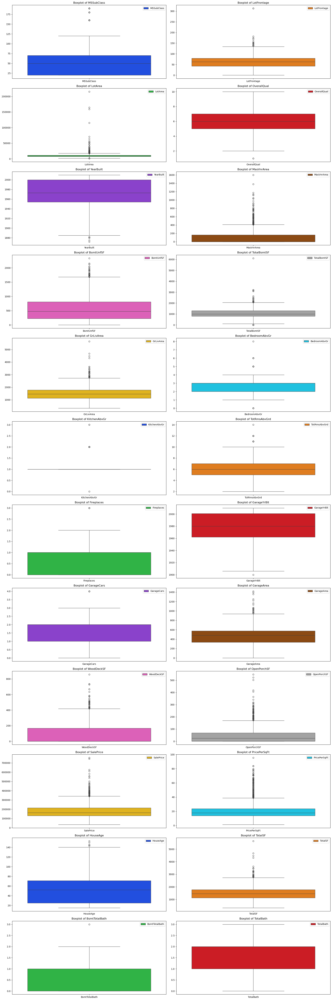

In [35]:
numeric_cols = df4.select_dtypes(include=['float64', 'int64','int32']).columns

num_rows = (len(numeric_cols) + 1) // 2

fig, axes = plt.subplots(ncols=2, nrows=num_rows, figsize=(20, num_rows * 5))

#Plot the boxplots for each numeric column in the dataset
for i, col in enumerate(numeric_cols):
    sns.boxplot(data=df4[[col]], ax=axes[i//2][i%2], color=sns.color_palette("bright", len(numeric_cols))[i])
    axes[i//2][i%2].set_title(f'Boxplot of {col}')
    axes[i//2][i%2].legend([col], loc='upper right')

for j in range(len(numeric_cols), num_rows * 2):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

# Capping outliers

In [36]:
#Selecting only numerical columns
numerical_columns = df4.select_dtypes(include=['float64', 'int64','int32']).columns

def cap_outliers(df4, column):
    Q1 = df4[column].quantile(0.25)
    Q3 = df4[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    capped = np.where(df4[column] < lower_bound, lower_bound, np.where(df4[column] > upper_bound, upper_bound, df4[column]))
    return capped.astype(df4[column].dtype) 

for column in numerical_columns:
    df4[column] = cap_outliers(df4, column)

print(df4.describe())

        MSSubClass  LotFrontage       LotArea  OverallQual    YearBuilt  \
count  1460.000000  1460.000000   1460.000000  1460.000000  1460.000000   
mean     55.085616    57.182192   9647.364384     6.100685  1971.299315   
min      20.000000     0.000000   1481.000000     2.000000  1885.000000   
25%      20.000000    42.000000   7553.500000     5.000000  1954.000000   
50%      50.000000    63.000000   9478.500000     6.000000  1973.000000   
75%      70.000000    79.000000  11601.500000     7.000000  2000.000000   
max     145.000000   134.000000  17673.000000    10.000000  2010.000000   
std      37.508183    32.925691   3594.306686     1.378430    30.108397   

        MasVnrArea    BsmtUnfSF  TotalBsmtSF    GrLivArea  BedroomAbvGr  \
count  1460.000000  1460.000000  1460.000000  1460.000000   1460.000000   
mean     89.364384   563.767808  1050.254795  1503.722603      2.839726   
min       0.000000     0.000000    42.000000   334.000000      0.000000   
25%       0.000000   223

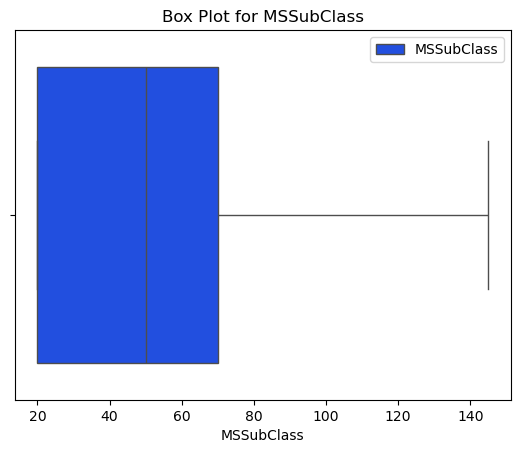

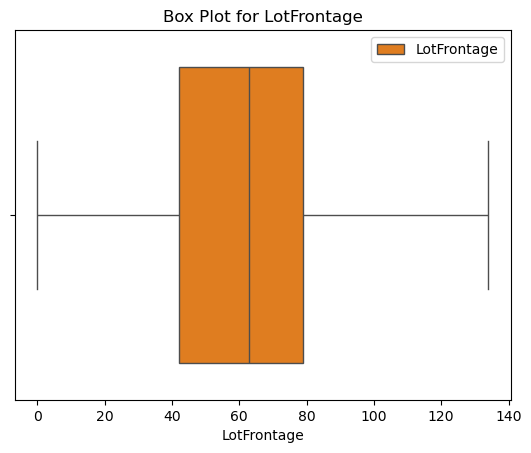

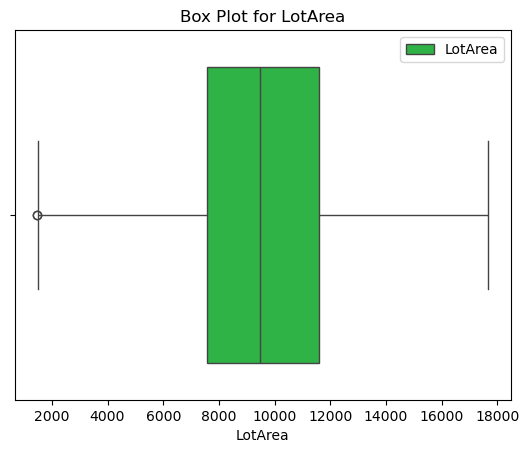

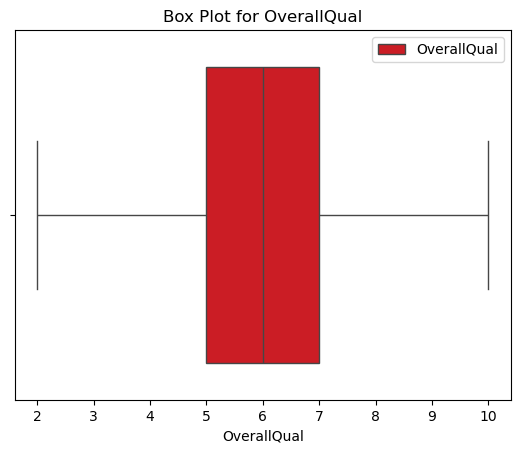

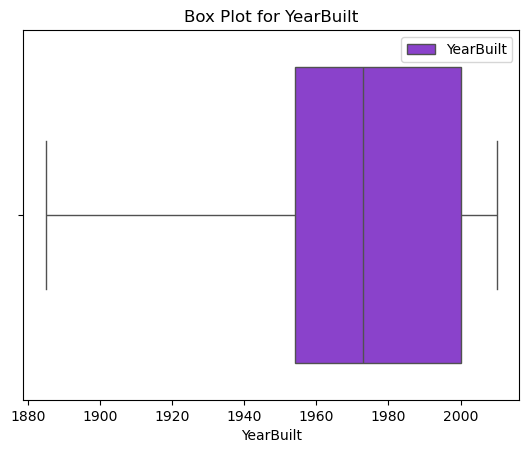

...

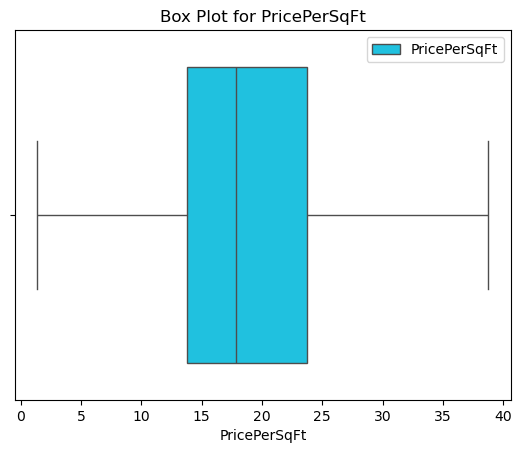

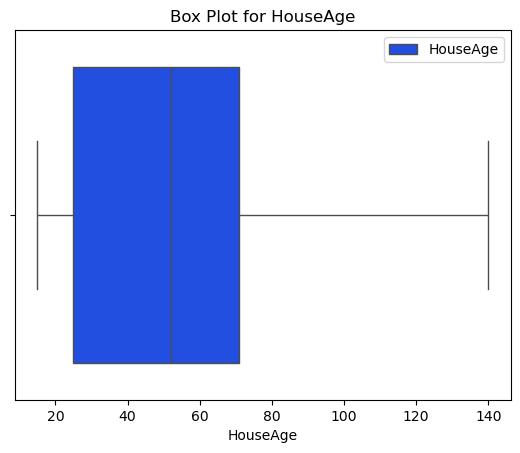

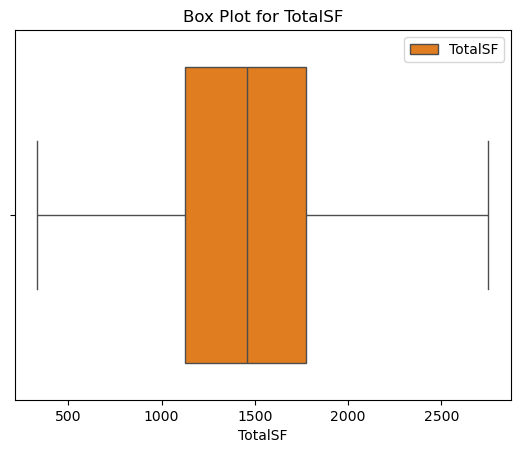

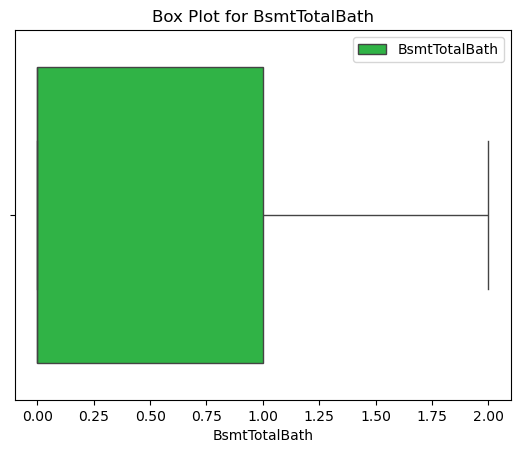

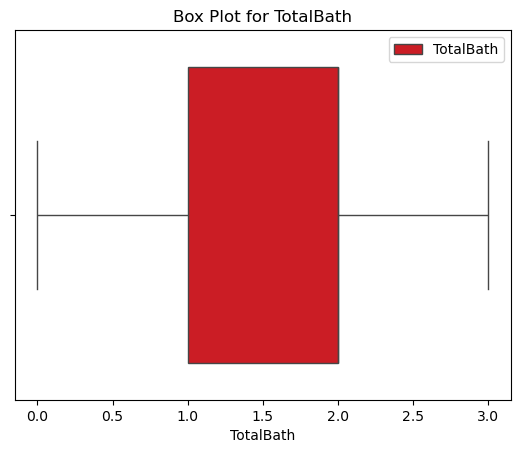

In [37]:
# Select numeric columns
numeric_columns = df4.select_dtypes(include=['number']).columns

colors = sns.color_palette("bright", len(numeric_columns))

for i, column in enumerate(numeric_columns):
    plt.figure()
    sns.boxplot(x=df4[column], color=colors[i])
    plt.legend([column], loc='upper right')
    plt.title(f'Box Plot for {column}')
    plt.show()

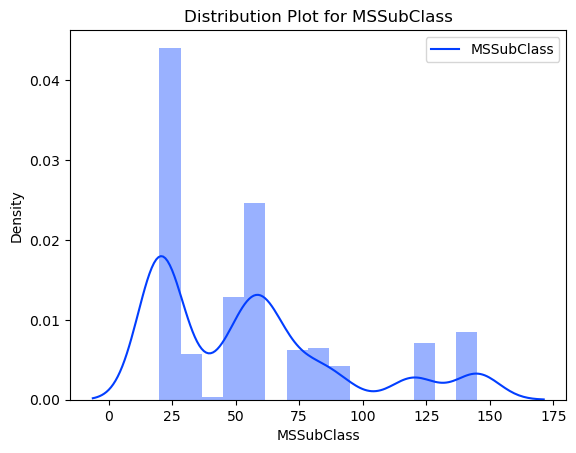

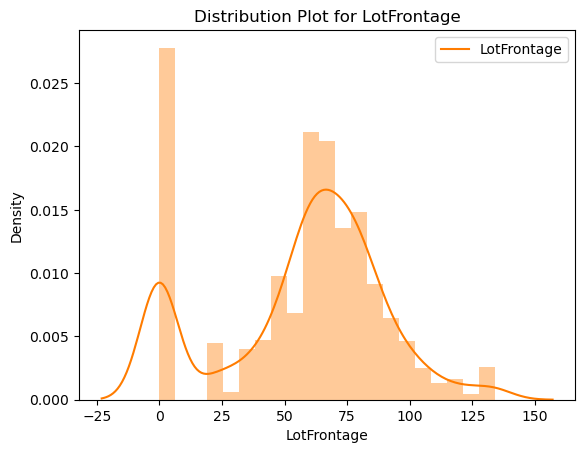

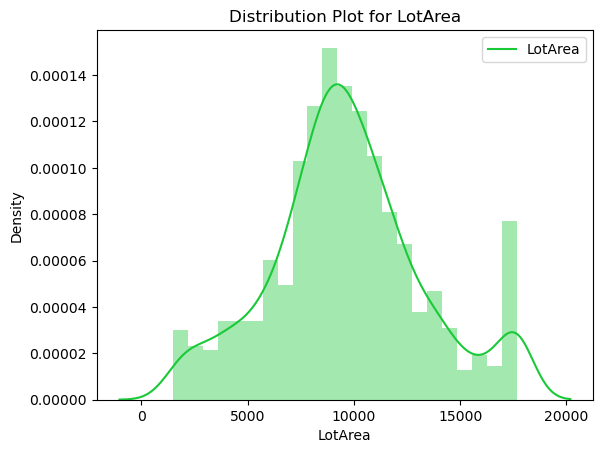

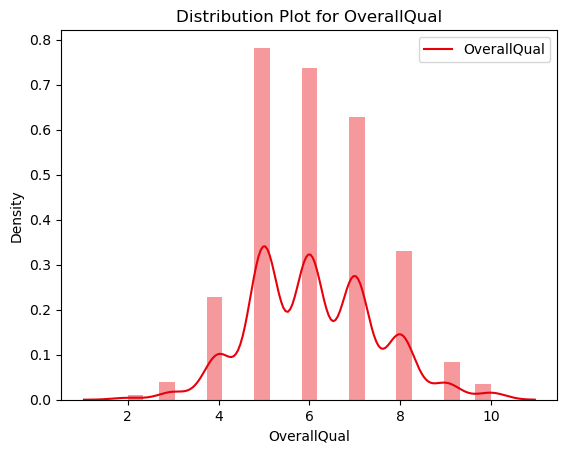

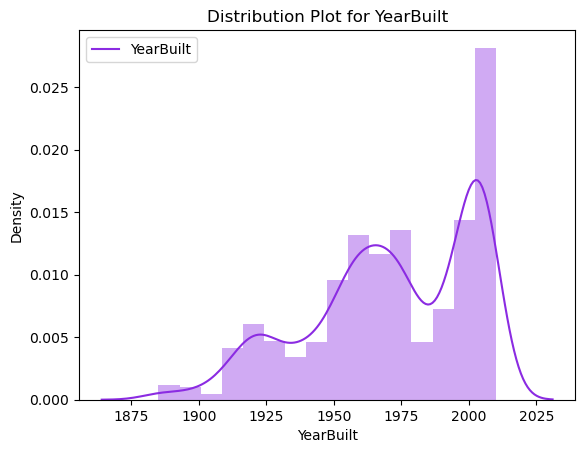

...

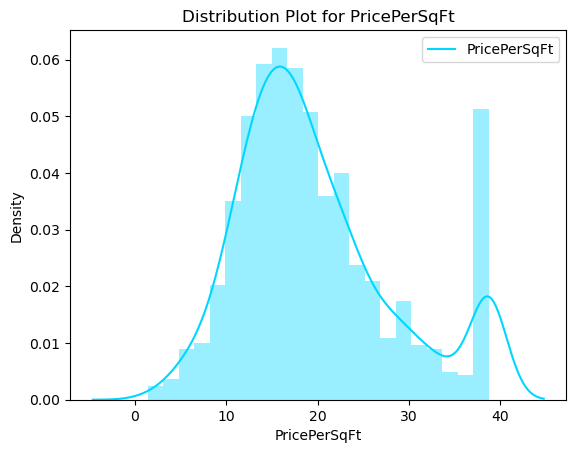

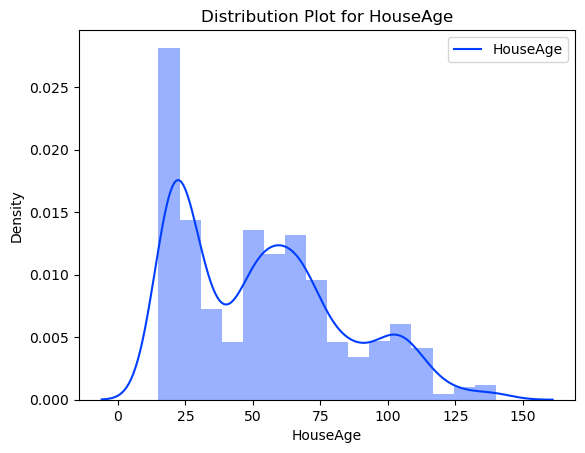

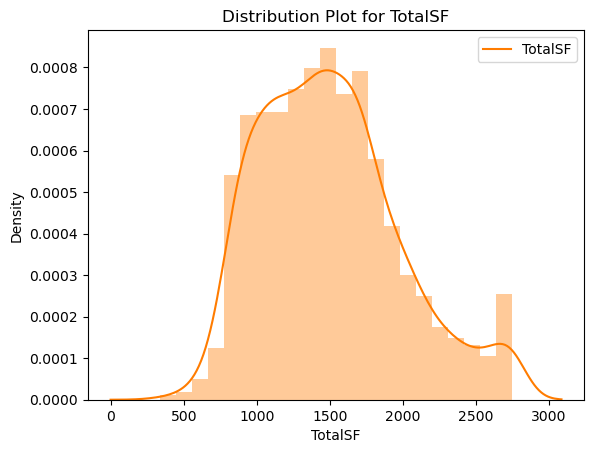

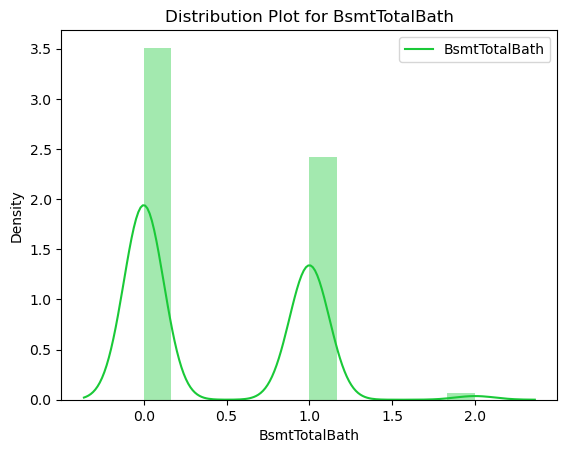

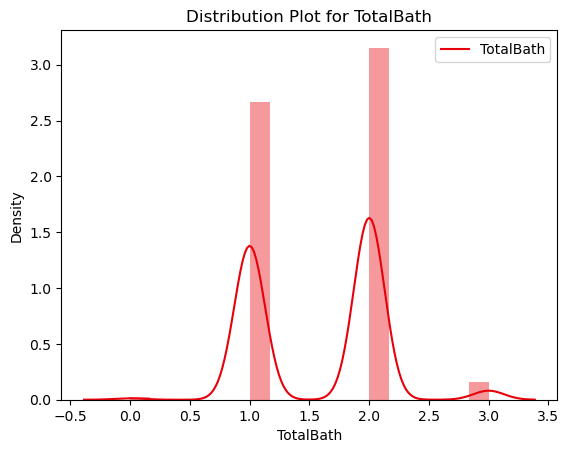

In [38]:
# Selecting only numerical columns
df3 = df4.select_dtypes(include=['float64', 'int64','int32']).columns

colors = sns.color_palette("bright", len(df4)) 

for i, column in enumerate(df3):
    plt.figure()
    sns.distplot(df4[column], kde=True, color=colors[i])
    plt.title(f'Distribution Plot for {column}')
    plt.legend([column])
    plt.show()

In [39]:
df4.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LandContour,LotConfig,Neighborhood,Condition,BldgType,HouseStyle,OverallQual,YearBuilt,RoofStyle,Exterior,MasVnrArea,ExterCond,Foundation,BsmtCond,BsmtFinType,BsmtUnfSF,TotalBsmtSF,Heating,CentralAir,Electrical,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageCars,GarageArea,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MiscFeature,SalePrice,MoYrSold,PricePerSqFt,HouseAge,TotalSF,BsmtTotalBath,TotalBath
0,60,RL,65,8450,Pave,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,2003,Gable,VinylSd,196,TA,PConc,TA,Unf,150,856,GasA,Y,SBrkr,1710,3,1,Gd,8,0,Attchd,2003,2,548,TA,Y,0,61,No,208500.0,2008-02-01,24.674556,22,1710,1,2
1,20,RL,80,9600,Pave,Lvl,FR2,Veenker,Feedr,1Fam,1Story,6,1976,Gable,MetalSd,0,TA,CBlock,TA,Unf,284,1262,GasA,Y,SBrkr,1262,3,1,TA,6,1,Attchd,1976,2,460,TA,Y,298,0,No,181500.0,2007-05-01,18.906250,49,1262,0,2
2,60,RL,68,11250,Pave,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,2001,Gable,VinylSd,162,TA,PConc,TA,Unf,434,920,GasA,Y,SBrkr,1786,3,1,Gd,6,1,Attchd,2001,2,608,TA,Y,0,42,No,223500.0,2008-09-01,19.866667,24,1786,1,2
3,70,RL,60,9550,Pave,Lvl,Corner,Crawfor,Norm,1Fam,2Story,7,1915,Gable,Wd Sdng,0,TA,BrkTil,Gd,Unf,540,756,GasA,Y,SBrkr,1717,3,1,Gd,7,1,Detchd,1998,3,642,TA,Y,0,35,No,140000.0,2006-02-01,14.659686,110,1717,1,1
4,60,RL,84,14260,Pave,Lvl,FR2,NoRidge,Norm,1Fam,2Story,8,2000,Gable,VinylSd,350,TA,PConc,TA,Unf,490,1145,GasA,Y,SBrkr,2198,4,1,Gd,9,1,Attchd,2000,3,836,TA,Y,192,84,No,250000.0,2008-12-01,17.531557,25,2198,1,2


# Univariate Analysis
Univariate analysis is a statistical method that examines a single variable in a data set. It's a fundamental technique for analyzing data and is used to describe and summarize the data. 

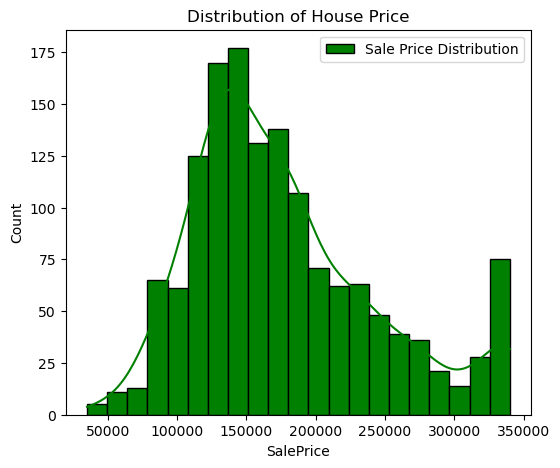

In [40]:
plt.figure(figsize=(6,5))
sns.histplot(df4['SalePrice'], kde=True, facecolor='Green', edgecolor="Black", label="Sale Price Distribution")
plt.title("Distribution of House Price")
plt.legend(loc='best')
plt.show()


# Insight
Here are some insights from the chart:

1.Most Common House Prices: The majority of house prices are between 100,000 and 200,000, with the highest concentration around 150,000.

2.Peak in Distribution: There is a noticeable peak around 150,000, indicating that this price range is the most common.

3.Right-Skewed Distribution: The distribution is right-skewed, meaning there are fewer houses priced above 200,000.

4.High-Priced Houses: There is a small secondary peak around 350,000, indicating that there are some high-priced houses as well.

### Count of Properties by GarageType'

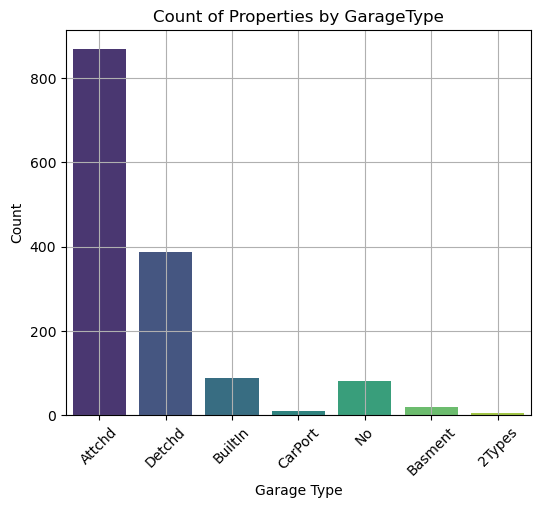

In [41]:
plt.figure(figsize=(6, 5))
sns.countplot(data=df4, x='GarageType', palette='viridis')
plt.title('Count of Properties by GarageType')
plt.xlabel('Garage Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Insights 

Dominant Garage Type: The majority of properties have attached garages (Attchd), with a count close to 900. This indicates that attached garages are highly preferred or more common in the dataset.

Detached Garages: Detached garages (Detchd) are the second most common type, with a count around 400. While not as popular as attached garages, they still constitute a significant portion of the properties.

Less Common Garage Types: Built-in garages (BuiltIn) and properties with no garage (No) have lower counts compared to attached and detached garages.

Rare Garage Types: Garage types like CarPort, Basment, and 2Types have the least counts, indicating they are quite rare in the dataset.

Urban Planning: The distribution of garage types can provide insights into urban planning and the design preferences of homeowners.

High Demand for Attached Garages: The high count of attached garages suggests a strong market preference for properties with this type of garage. This could be due to convenience and direct access to the home.

Detached Garage Appeal: Detached garages are still relatively common, indicating that there is a significant market segment that prefers or values detached garages.

Properties with rare garage types like CarPort, Basment, and 2Types might cater to niche markets or specific buyer preferences.

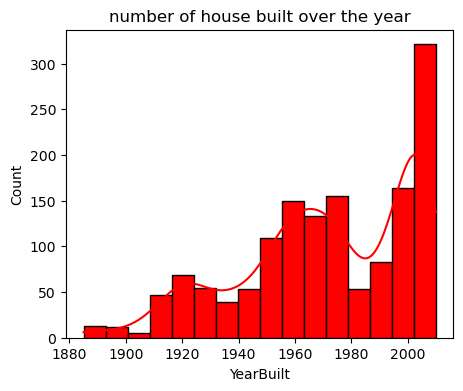

In [42]:
plt.figure(figsize=(5,4))
sns.histplot(df4['YearBuilt'],kde=True,facecolor='red',edgecolor='black')
plt.title('number of house built over the year')
plt.show()

# Insights

1.General Trend: There is a clear upward trend in the number of houses built over the years. This indicates increasing construction activity over time.

2.Significant Peak Around 2000: The graph shows a notable peak around the year 2000, where the number of houses built exceeds 300. This suggests a construction boom or high demand for housing during that period.

3.Early Years (1880-1950): The number of houses built in the early years is relatively low, indicating less construction activity during that time. This could be due to factors like lower population, limited construction technology, or different housing needs.

4.Steady Growth Post-1950: After 1950, there is a steady increase in the number of houses built, reflecting economic development, urbanization, and increased demand for housing.

5.Recent Years Surge: The significant increase in house construction in the late 20th century and early 21st century highlights the impact of various factors such as population growth, economic stability, and advancements in construction technology.

6.Fluctuations: While the overall trend is upward, there are periods of fluctuation, indicating that construction activity was not consistent every year.

Overall, the graph shows that housing development has progressively increased, with a substantial surge around the year 2000, reflecting changes in economic, social, and technological factors.

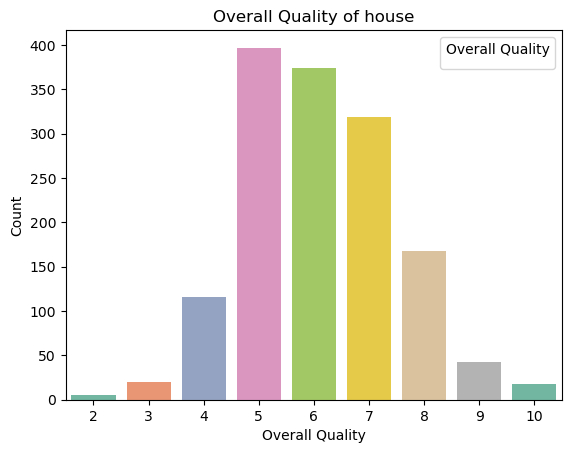

In [43]:
color_palette = sns.color_palette('Set2')
sns.countplot(x='OverallQual', data=df4, palette=color_palette)
plt.title('Overall Quality of house')
plt.xlabel('Overall Quality')
plt.ylabel('Count')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, labels, title='Overall Quality', loc='upper right')
plt.show()

# Insight

1.Common Ratings: The most common overall quality ratings are 5 and 6, with counts close to 400 and 375, respectively. This suggests that most properties have average to slightly above-average quality.

2.Moderate Ratings: Ratings of 7 are also relatively common, with a count of around 300. This indicates a significant number of properties have above-average quality.

3.Low Ratings: Ratings of 4 and 8 have moderate counts, around 50 and 175, respectively. This shows fewer properties with below-average or good quality.

4.Rare Ratings: Ratings of 9 and 10 are less common, with counts around 50 and 25, respectively. This indicates that properties with excellent quality are rare.

5.Absent Ratings: Ratings of 1, 2, and 3 are not present in the data, suggesting that properties with poor quality are not in the dataset.

6.Average Quality Properties: Given that the most frequent ratings are 5 and 6, we can infer that the majority of the properties fall within an average quality range. This might reflect the standard quality expectations for houses in this dataset.

7.Investment Opportunities: The rarity of properties with ratings of 9 and 10 might suggest that high-quality properties are in high demand and could be good investment opportunities due to their scarcity.

Overall, the data shows a concentration of properties with average to above-average quality, with fewer properties at the extremes of the quality spectrum.

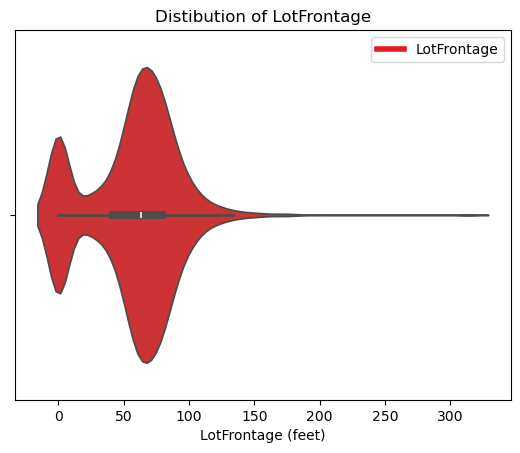

In [44]:
color_palette = sns.color_palette('Set1')
sns.violinplot(x=df1['LotFrontage'], palette=color_palette)
plt.title('Distibution of LotFrontage')
plt.xlabel('LotFrontage (feet)')
handles = [plt.Line2D([0], [0], color=color_palette[0], lw=4)]
labels = ['LotFrontage']
plt.legend(handles, labels, loc='upper right')
plt.show()

# Insights

1.Distribution Concentration: Most of the LotFrontage values are concentrated between 0 to 100 feet, with the peak around 60 feet. This suggests that the majority of properties have a lot frontage close to 60 feet.

2.Density Peaks: The plot's widest part, around 60 feet, indicates that this value is the most common among the properties.

3.Long Tail: There is a long tail extending towards higher values, showing that there are some lots with significantly larger frontages, up to around 300 feet. These larger frontages are less common, as indicated by the narrower sections of the plot at these values.

4.Symmetry and Skewness: The plot is somewhat symmetrical but shows slight skewness towards higher LotFrontage values, indicating that while most properties have average-sized frontages, there are more properties with larger-than-average frontages compared to smaller ones.

5.Spread of Data: The plot shows a clear spread, suggesting diversity in lot frontage sizes, but with most values concentrated in the lower to middle range.

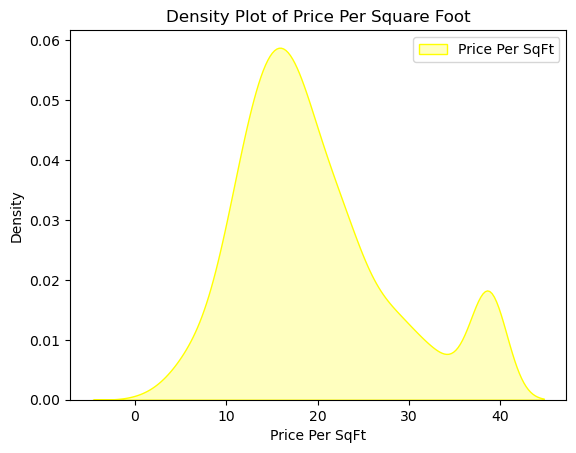

In [45]:
sns.kdeplot(df4['PricePerSqFt'], shade=True, color='yellow', label='Price Per SqFt')
plt.title('Density Plot of Price Per Square Foot')
plt.xlabel('Price Per SqFt')
plt.ylabel('Density')
plt.legend()
plt.show()



# Insights

1.Peak at 15 Price Per SqFt: Many properties have a price per square foot around 15, which indicates that this value is quite common in the market.

2.Secondary Peak at 35 Price Per SqFt: A smaller peak around 35 suggests that some properties are clustered in a higher price range.

3.Distribution Spread: The plot also shows the overall distribution of price per square foot values, with most properties falling between 0 and 40.

Additional Insights:

1.Market Popularity: The major peak at 15 indicates that the majority of the properties are priced within a reasonable and attractive range for buyers. This suggests that the market might have a significant number of mid-range properties.

2.Premium Segment: The secondary peak at 35 indicates a niche market segment for higher-priced properties. These could be luxury homes or properties with unique features that justify a higher price per square foot.

3.Market Dynamics: The distribution spread helps in understanding the diversity of the market. It shows that there is a wide range of property prices, catering to different buyer segments. This diversity can be beneficial for both buyers and sellers as it provides various options to match different preferences and budgets.

4.Investment Opportunities: The peaks and distribution can guide investors in identifying potential investment opportunities. For instance, properties around the major peak can be targeted for stable investments, while those around the secondary peak can be considered for high-end investments.

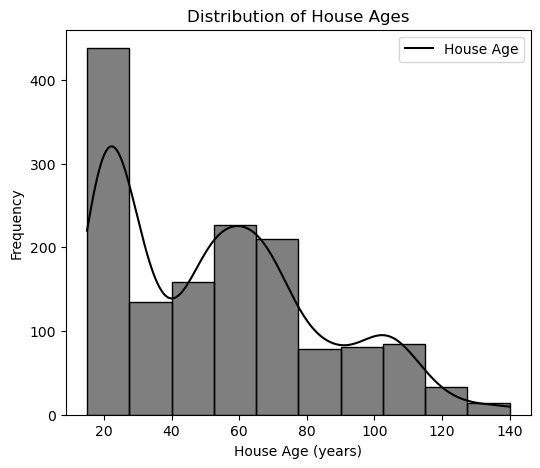

In [46]:
plt.figure(figsize=(6, 5))
ax = sns.histplot(df4['HouseAge'], bins=10, kde=True, color='black')
plt.title('Distribution of House Ages')
plt.xlabel('House Age (years)')
plt.ylabel('Frequency')
ax.legend(['House Age'])
plt.show()


# Insights

1.Dominance of Newer Houses: The majority of houses are relatively young, with the highest frequency of houses being around 20 years old. This indicates that there has been significant construction in recent years.

2.Declining Frequency with Age: There is a noticeable decline in the number of houses as age increases. This suggests that there are fewer older houses, which could be due to factors such as demolitions, renovations, or the natural life cycle of buildings.

3.Clusters of Older Houses: There are smaller peaks around 40, 60, and 100 years. These clusters indicate that there were periods in the past where a substantial number of houses were built. These periods could correspond to historical events, economic booms, or other factors influencing construction trends.

4.Skewness: The data is right-skewed (positive skewness), meaning that the distribution has a long tail extending towards older ages. This suggests that while most houses are relatively new, there is a minority of much older houses contributing to the overall distribution.

5.Real Estate and Urban Planning: Understanding the distribution of house ages can be valuable for real estate analysis and urban planning. For instance, a high concentration of newer houses could indicate a growing or recently developed area, while older houses might be found in more established neighborhoods with historical significance.

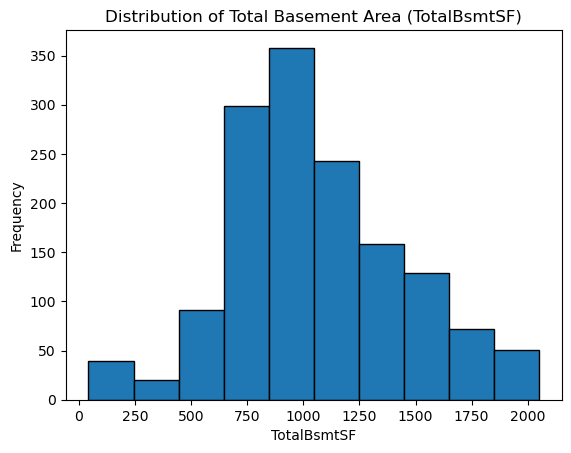

In [47]:
plt.hist(df4['TotalBsmtSF'], bins=10, edgecolor='black')
plt.title('Distribution of Total Basement Area (TotalBsmtSF)')
plt.xlabel('TotalBsmtSF')
plt.ylabel('Frequency')
plt.show()


# Insights

1.Most Common Basement Area Size: The most common basement area size is between 750 and 1000 square feet, with the highest frequency of around 350 occurrences.

2.Noticeable Peak: There is a noticeable peak in the distribution around 750 to 1000 square feet, indicating that most properties have basement areas within this range.

3.Right-Skewed Distribution: The distribution is right-skewed, meaning there are fewer properties with larger basement areas (above 1500 square feet).

4.Decreasing Frequency: The frequency decreases as the basement area increases beyond 1000 square feet, suggesting that larger basements are less common.

1.Preference for Medium-Sized Basements: The market trend indicates a preference or prevalence for medium-sized basements (750-1250 square feet) in the properties surveyed.

2.Utility and Cost Efficiency: Medium-sized basements may offer a good balance between utility and cost efficiency, making them more attractive to buyers and developers.

3.Rarity of Large Basements: The right-skewed distribution suggests that larger basements (above 1500 square feet) are less common, potentially due to higher construction costs and lower demand.

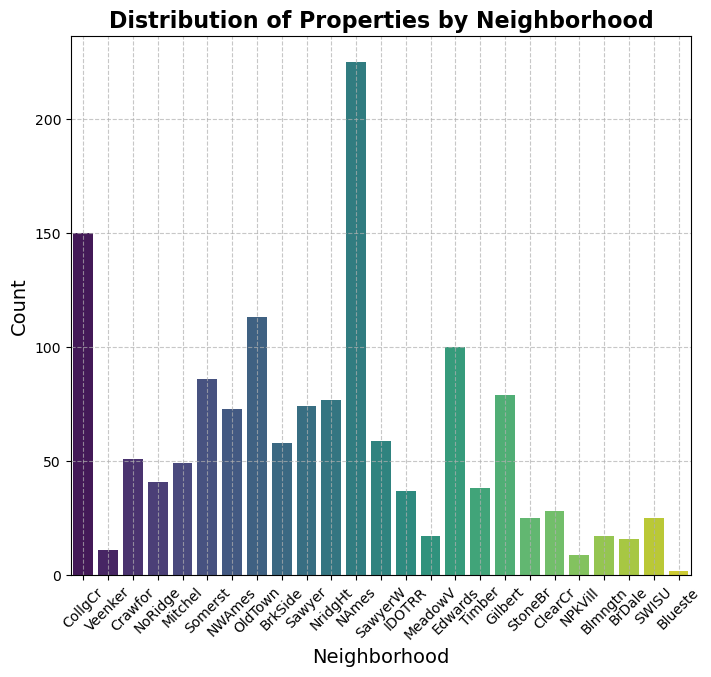

In [48]:
plt.figure(figsize=(8, 7))
sns.countplot(x='Neighborhood', data=df4, palette='viridis')
plt.title('Distribution of Properties by Neighborhood', fontsize=16, fontweight='bold')
plt.xlabel('Neighborhood', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


# Insights

1.Property Distribution: The chart indicates that NAmes has the highest number of properties, with over 200 properties, while Blueste has the lowest count with fewer than 10 properties.

2.Neighborhood Popularity: Neighborhoods like CollgCr, Veenker, Crawfor, and NoRidge also have a significant number of properties, suggesting they are popular or well-developed areas.

3.Market Demand: The varying counts of properties across neighborhoods can indicate differences in market demand, property values, and investment opportunities.

1.High Demand Areas: Neighborhoods with a higher number of properties, such as NAmes, might be experiencing higher demand, leading to potential price increases and investment interest.

2.Emerging Areas: Neighborhoods with fewer properties, like Blueste, could be emerging markets with potential for growth and development.

3.Investment Opportunities: Investors might look for neighborhoods with moderate property counts and growth potential, such as Somerst, NWAmes, and OldTown, for balanced investment opportunities.

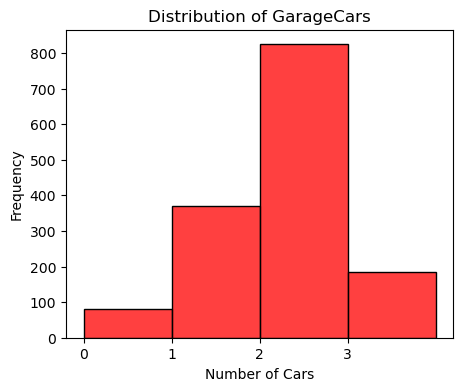

In [49]:
plt.figure(figsize=(5, 4))
sns.histplot(df4['GarageCars'], bins=range(df4['GarageCars'].min(), df4['GarageCars'].max() + 2), kde=False, color='red')
plt.title('Distribution of GarageCars')
plt.xlabel('Number of Cars')
plt.ylabel('Frequency')
plt.xticks(range(df4['GarageCars'].min(), df4['GarageCars'].max() + 1))
plt.show()

# Insights

Most Common Garage Size:

The majority of homes have garages that can accommodate 2 cars, with a frequency of approximately 800. This suggests that 2-car garages are the standard in this dataset.

Other Garage Sizes:

Garages with space for 1 car are the next most common, with a frequency of approximately 400.

Garages that can accommodate 3 cars have a frequency of about 300.

Garages with space for 0 cars are the least common, with a frequency of around 50.

Implications:

Most homes have medium-sized garages, suitable for 2 cars. This indicates a typical expectation for home buyers in this market.

Smaller garages (1 car) and larger garages (3 cars) are less common but still present in notable amounts.

Homes without garages are rare, suggesting that a garage is a desirable feature for most buyers.

Visual Insights:
Bar Chart: The bars show the frequency of different garage sizes, with a clear peak at 2-car garages, indicating their popularity.

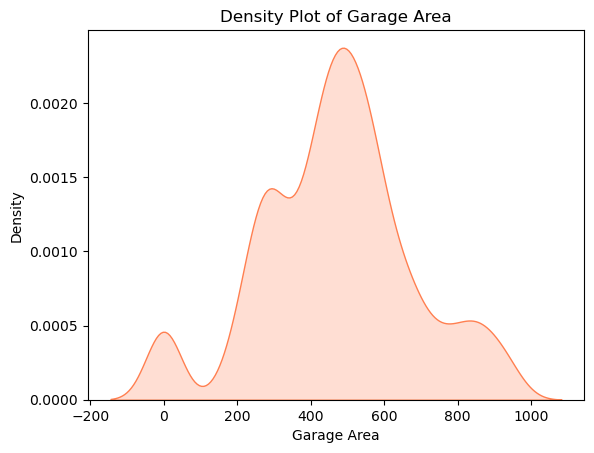

In [50]:
sns.kdeplot(df4['GarageArea'], shade=True, color='coral')
plt.title('Density Plot of Garage Area')
plt.xlabel('Garage Area')
plt.ylabel('Density')
plt.show()

# Insights

Common Garage Sizes: The highest density peak around 500 square feet suggests that this is the most common garage size in your dataset.

Variation in Sizes: There's also a smaller peak around 200 square feet, indicating another group of garages with this size.

Distribution Spread: As garage areas move away from these peaks, the density decreases, showing that there are fewer garages with very small or very large areas.

Market Preferences: This distribution helps understand market preferences for garage sizes, with 500 sq ft being a preferred size.

Popular Garage Sizes: Market demand seems higher for garages around 500 sq ft, likely due to being spacious enough for typical storage and vehicle needs.

Emerging Trends: The presence of smaller peaks (like around 200 sq ft) can indicate a trend towards smaller or multi-functional garages.

Impact on Property Value: Given that the most common garage size is around 400-500 sq ft, this size might be optimal for maintaining or increasing property value. Smaller or larger garages might not have the same impact.



# Bivariate analysis

Bivariate analysis refers to the analysis of two variables to determine relationships between them.

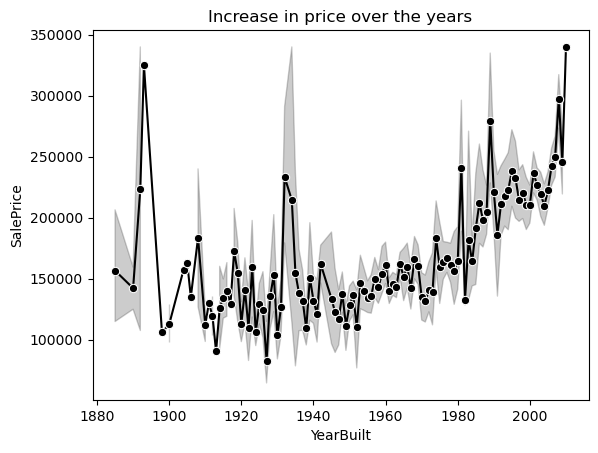

In [51]:
sns.lineplot(x='YearBuilt',y='SalePrice',data=df4,marker='o',color='Black')
plt.title('Increase in price over the years')
plt.show()

# Insights

Sale Prices Variability: There is significant variability in sale prices, especially during 1880-1940, where several extreme peaks and troughs are observed.

Consistent Upward Trend: After 1940, sale prices show a consistent upward trend, with some fluctuations.

Recent Years Increase: Sale prices have seen a noticeable rise since 1980.

Highest Sale Prices: During 2000,the highest sale prices were observed, indicating a strong upward trend.

Variability: The shaded area around the line suggests data variability, but the overall trend shows an increase in sale prices.

Property Market: Property values have been increasing over time, especially in recent years.

Investment Opportunities: This trend suggests that investing in property could be profitable, especially in the long term.

Market Stability: Despite some fluctuations, the overall market trend shows stability and growth.

Significant Variability: There is significant variability in sale prices over the years, with some years showing very high prices and others much lower.

Noticeable Increase: There is a noticeable increase in sale prices starting from around 1980, with a more pronounced upward trend continuing into the 2000s.

Early Years Fluctuation: The early years (1880-1920) show a lot of fluctuation in prices, with some peaks and troughs.

Stable Period: The period from 1920 to 1980 shows relatively stable prices with some fluctuations but no clear upward or downward trend.



## SalePrice vs. GrLivArea

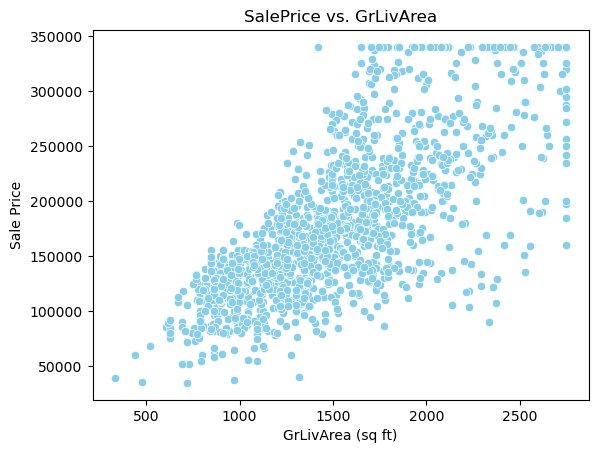

In [52]:
sns.scatterplot(x='GrLivArea', y='SalePrice', data=df4,color='skyblue')
plt.title('SalePrice vs. GrLivArea')
plt.xlabel('GrLivArea (sq ft)')
plt.ylabel('Sale Price')
plt.show()


# Insight

1.Positive Correlation: The plot shows a clear positive correlation between the ground living area (GrLivArea) and the sale price. As the living area increases, the sale price tends to rise as well. Larger homes generally command higher prices.

2.Data Density: Most of the data points are concentrated between 1000 to 2000 square feet for GrLivArea and between ₹100,000 to ₹250,000 for Sale Price. This suggests that the majority of houses in this dataset fall within these size and price ranges.

The general trend shows steady demand for homes with larger living areas, indicating that buyers prioritize living space when making purchasing decisions.

The clustering of data points in the mid-range (₹100,000 to ₹250,000) suggests this is a common budget range for most buyers in the market. This can help sellers and real estate agents set realistic price expectations.



## SalePrice vs. OverallQual

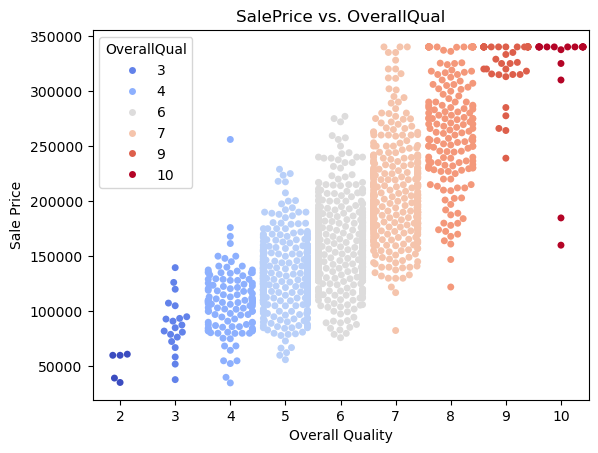

In [90]:
sns.swarmplot(x='OverallQual', y='SalePrice', hue='OverallQual', data=df4, palette='coolwarm')
plt.title('SalePrice vs. OverallQual')
plt.xlabel('Overall Quality')
plt.ylabel('Sale Price')
plt.show()


# Insights

Positive Correlation:

There is a clear positive correlation between OverallQual and SalePrice. As the overall quality of the house increases, the sale price also tends to increase.

Quality Level Distribution:

OverallQual 3 and 4: Houses with an overall quality rating of 3 and 4 have lower sale prices, primarily ranging below ₹100,000. This indicates that lower-quality homes are less valued in the market.

OverallQual 6 and 7: Most of the data points are concentrated around quality levels 6 and 7. These homes have a wide range of sale prices, indicating that mid-quality homes are quite common and have varied pricing.

OverallQual 9 and 10: Houses with the highest quality ratings of 9 and 10 command the highest sale prices, often above ₹300,000. This shows that buyers are willing to pay a premium for top-quality homes.

Price Variability:

Higher quality homes (OverallQual 7 to 10) show more variability in sale prices. This suggests that factors like location, additional features, and unique characteristics contribute to the wide range of prices for high-quality homes.

Market Segments:

The plot reveals distinct market segments based on overall quality. Lower quality homes (OverallQual 3 and 4) occupy the budget segment, mid-quality homes (OverallQual 6 and 7) fall in the average market segment, and high-quality homes (OverallQual 9 and 10) represent the luxury segment.

There is a significant premium on higher quality homes. Buyers are willing to pay more for houses with better construction materials, design, and finishes. This trend is evident from the sharp increase in sale prices for homes with higher overall quality.

for Mid-Quality Homes:

The concentration of data points around mid-quality levels (6 and 7) indicates a strong demand for these homes. These homes offer a balance between quality and affordability, making them attractive to a broad range of buyers.

The presence of high-value homes with quality ratings of 9 and 10 highlights a strong luxury market segment. These homes cater to buyers seeking premium features and are willing to pay a higher price for superior quality.

## SalePrice vs. HouseStyle

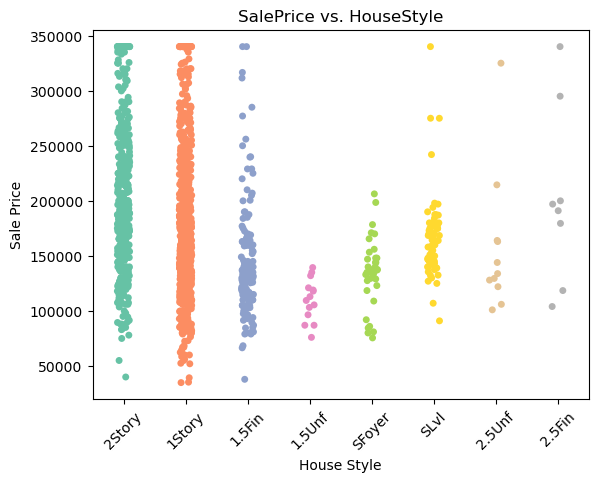

In [54]:
sns.stripplot(data=df4, x='HouseStyle', y='SalePrice', palette='Set2', jitter=True)
plt.title('SalePrice vs. HouseStyle')
plt.xlabel('House Style')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)  
plt.show()

# Insights

1. 2Story and 1Story houses: These house styles have the highest number of data points, indicating they are the most common. The sale prices for these styles range broadly from around 50,000 to 350,000.

2. 1.5Fin houses: These houses have sale prices mostly between 100,000 and 250,000.

3. 1.5Unf houses: These houses have lower sale prices, mostly between 50,000 and 150,000.

4. SFoyer houses: These houses have sale prices ranging from around 50,000 to 200,000.

5. SLvl houses: These houses have sale prices mostly between 50,000 and 250,000.

6. 2.5Unf and 2.5Fin houses: These house styles have fewer data points, indicating they are less common. The sale prices for these styles range from around 100,000 to 300,000.

Popularity: 2Story and 1Story houses are the most popular, as indicated by the high number of data points.

Price Range: The sale prices vary widely within each house style, but 2Story and 1Story houses have the highest potential sale prices.

Less Common Styles: 2.5Unf and 2.5Fin houses are less common but can still fetch high prices.

## SalePrice vs GarageArea

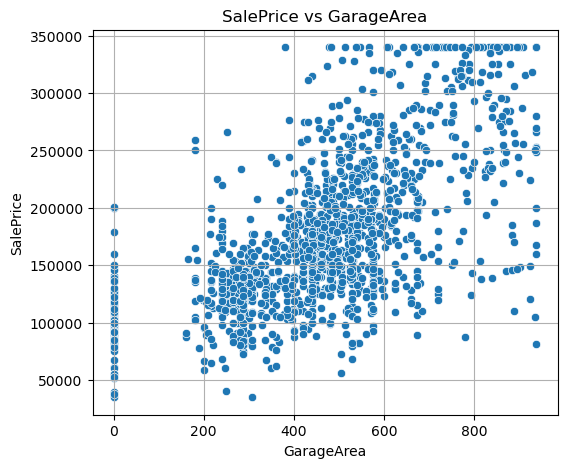

In [55]:
plt.figure(figsize=(6,5))
sns.scatterplot(data=df4, x='GarageArea', y='SalePrice',markers='o',)
plt.title('SalePrice vs GarageArea')
plt.xlabel('GarageArea')
plt.ylabel('SalePrice')
plt.grid(True)
plt.show()

# Insights

Positive Correlation: There is a general positive correlation between GarageArea and SalePrice, indicating that properties with larger garage areas tend to have higher sale prices.

No Garage Properties: A significant number of properties have a GarageArea of 0, which likely represents properties without a garage. These properties generally have lower sale prices.

Dense Data Points: The data points are more densely populated between GarageArea values of 200 to 800 square feet and SalePrice values of 100,000 to 250,000 .

## HouseAge vs SalePrice

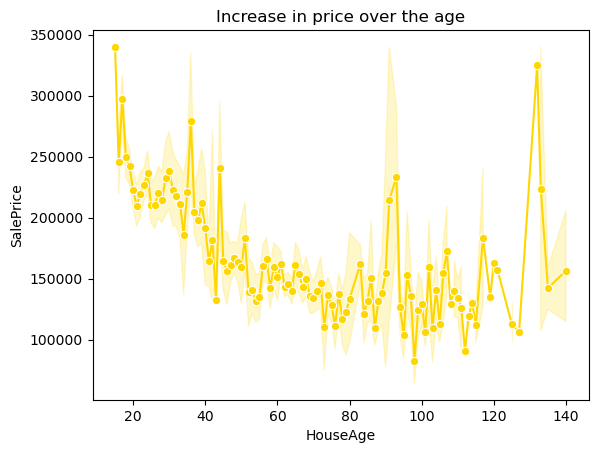

In [56]:
sns.lineplot(x='HouseAge',y='SalePrice',data=df4,marker='o',color='gold')
plt.title('Increase in price over the age')
plt.show()

# Insights

Age Impact on Price: I observed the general downward slope of the line graph, which indicates that sale prices of houses tend to decrease as the age of the house increases. This trend is visually apparent from the graph.

Stabilization Point: Around the 60-year mark, the line starts to level off, indicating that the sale prices tend to stabilize for houses older than 60 years. This suggests a consistent market value for very old houses.

Price Spikes: I noticed significant upward spikes at certain ages, such as around 20, 80, and 140 years. These spikes stand out from the general downward trend and indicate higher sale prices for houses at these specific ages.

Potential Investment Opportunities: The significant price spikes around 20, 80, and 140 years indicate potential investment opportunities. Houses of these ages may have unique characteristics or historical significance that make them more valuable. Investors could focus on these age groups for potential high returns.

Renovation vs. New Construction: The gradual decrease in sale prices as houses age suggests that newer houses tend to have higher market values. This could imply that investing in new construction or recently renovated houses might be more profitable than buying older houses.

Market Segmentation: The graph suggests different market segments based on house age. For instance, houses aged 0-20 years might attract buyers looking for modern amenities and newer construction, while houses aged 60+ years might appeal to buyers interested in historical or vintage properties.

Price Stability for Older Homes: The stabilization of prices after around 60 years indicates that older homes might have a stable market value. This stability could be attractive for long-term investors or buyers looking for properties with consistent value.

## 'LotArea vs. GrLivArea'

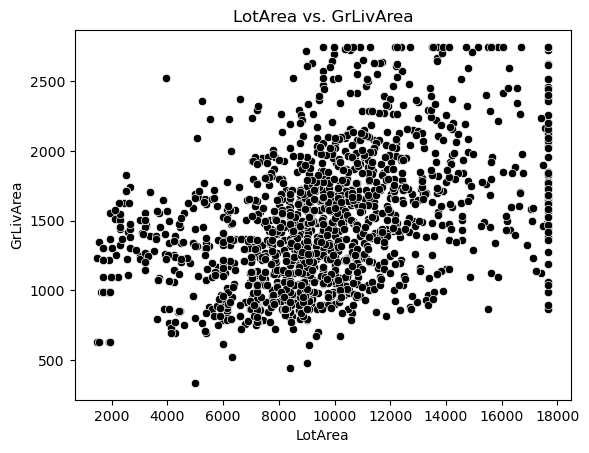

In [57]:
sns.scatterplot(x='LotArea',y='GrLivArea',data=df4,marker='o',color='black')
plt.title('LotArea vs. GrLivArea')
plt.show()

# Insights

Positive Correlation: There's a clear positive correlation between LotArea and GrLivArea. As the lot area increases, the ground living area also tends to increase.

Clusters: The data points are densely clustered between LotArea values of 4000 to 12000 and GrLivArea values of 1000 to 2000. This suggests that most properties fall within these ranges.

Property Size: Properties with larger lot areas and living areas might be more expensive, as indicated by the title "Increase in price over the age."

Popular Lot Sizes: The clustering of data points suggests that medium-sized lots (4000-12000) with moderate living areas (1000-2000) are popular.

Premium Properties: Properties with larger lot and living areas tend to be on the higher end of the market. These could be premium listings attracting higher prices.



## MSZoning vs. SalePrice

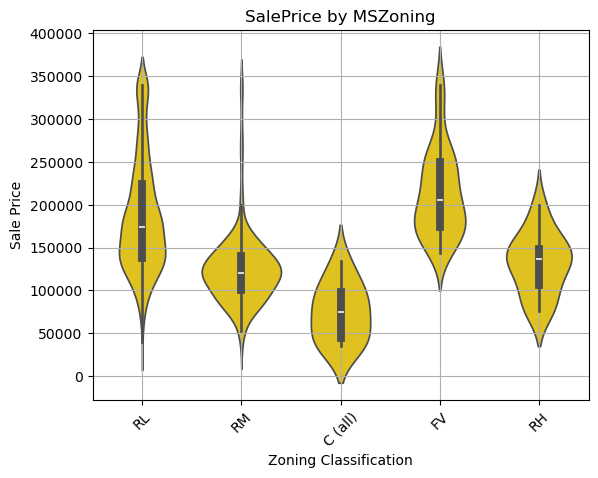

In [58]:
sns.violinplot(data=df4, x='MSZoning', y='SalePrice',color='gold')
plt.title('SalePrice by MSZoning')
plt.xlabel('Zoning Classification')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)
plt.grid(True) 
plt.show()


# Insights

RL (Residential Low Density):

Wide Range of Prices: RL zoning has a wide range of sale prices, with many properties around the 200,000 mark.

Higher Density at Median: The density is higher near the median price, suggesting that many properties fall within this range.

RM (Residential Medium Density):

Similar to RL: The RM category shows a similar range of sale prices to RL, but with a slightly lower median price.

Moderate Density: The price distribution is more spread out compared to RL.

C (Commercial):

Lowest Median Price: The C category has the lowest median sale price among all zonings.

Narrow Price Range: The distribution is narrower, indicating less variability in sale prices within commercial zones.

FV (Floating Village Residential):

Highest Median Price: FV zoning has the highest median sale price, indicating that properties in this zone are more valuable.

Wide Range of Prices: There is a wide range of prices, showing diversity in property values within this category.

RH (Residential High Density):

Moderate Median Price: The RH category has a moderate median sale price with a relatively wide range.

Spread Out Distribution: The prices are spread out, indicating variability in property values in high-density residential areas.

Desirable Areas: Properties in FV zoning are more valuable, indicating higher desirability or more premium features.

Comparative Market Values: RL and RM zoning show similar distributions, suggesting comparable market values for low and medium-density residential areas.

Affordable Options: The C zoning provides more affordable property options, with the lowest sale prices.

Diverse Values: RH zoning shows a wide range of prices, reflecting variability in property values and potential for investment or development.

### SalePrice by GarageType'

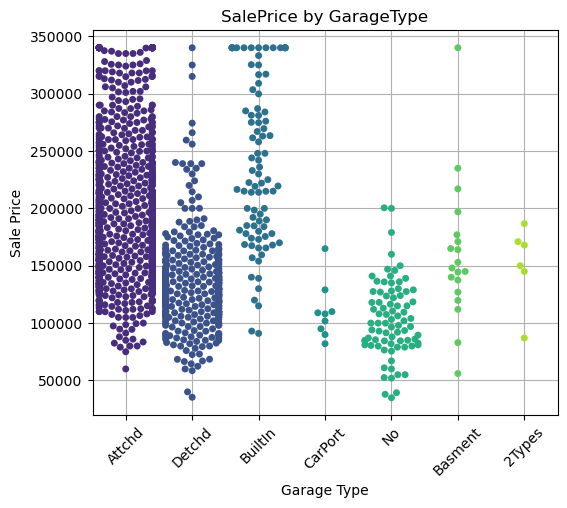

In [59]:
plt.figure(figsize=(6, 5))
sns.swarmplot(data=df4, x='GarageType', y='SalePrice', palette='viridis')
plt.title('SalePrice by GarageType')
plt.xlabel('Garage Type')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


# Insights

Variation in Sale Prices:

Attached Garages: There is a notable variation in sale prices within properties with attached garages. This suggests a wide range of property types, from modest homes to more luxurious ones, all sharing this garage type.

Detached Garages: Detached garages also show a wide range of sale prices, which could indicate a mix of different property sizes and conditions.

Luxury Segment:

Two Types of Garages (2Types): Properties with two types of garages are positioned in the higher price segment. This indicates that having multiple garage options is seen as a luxury feature, attracting higher sale prices.

Median Sale Prices:

CarPort and No Garage: Properties with carports or no garages generally fall into the lower median sale prices. This could point to a market preference for enclosed garages, which offer better protection for vehicles and storage space.

Built-In Garages and Basement Garages:

Uniformity: Built-in garages and basement garages show relatively consistent sale prices, with less variation compared to attached and detached garages. This suggests a more uniform quality and size of properties within these categories.

### 'SalePrice vs. LotArea'

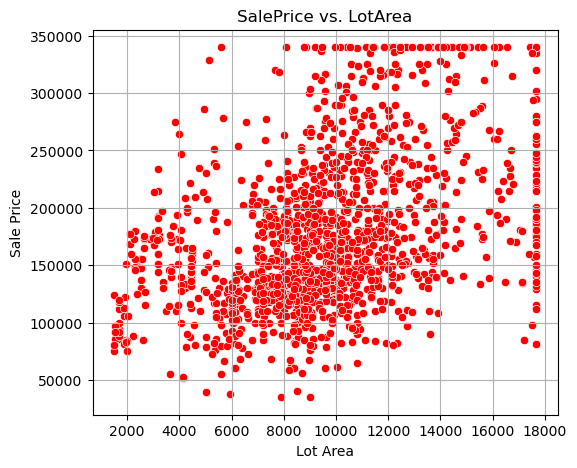

In [60]:
plt.figure(figsize=(6, 5))
sns.scatterplot(data=df4, x='LotArea', y='SalePrice',color='red')
plt.title('SalePrice vs. LotArea')
plt.xlabel('Lot Area')
plt.ylabel('Sale Price')
plt.grid(True)
plt.show()


# Insights

1.There is a positive correlation between lot area and sale price. Generally, as the lot area increases, the sale price also tends to increase.

2.The data points are widely scattered, indicating significant variability in sale prices for similar lot areas. This suggests that other factors besides lot area also influence the sale price.

3.The majority of the data points are concentrated between lot areas of 2,000 to 12,000 square feet and sale prices of ₹50,000 to ₹2,50,000. This indicates that most properties fall within these ranges.

4.Larger lot areas tend to fetch higher sale prices. This suggests a market preference for properties with more land, potentially due to the additional space and potential for future development.

5.Multiple clusters of data points can be observed. One major cluster is around lot areas of 5,000 to 10,000 square feet and sale prices of ₹1,00,000 to ₹2,00,000. Another smaller cluster is for lot areas of 15,000 to 20,000 square feet and sale prices of ₹2,50,000 to ₹3,50,000.

6.Some properties with smaller lot areas (below 2,000 square feet) have relatively low sale prices, indicating these might be entry-level or budget properties.

### SalePrice vs. PricePerSqFt

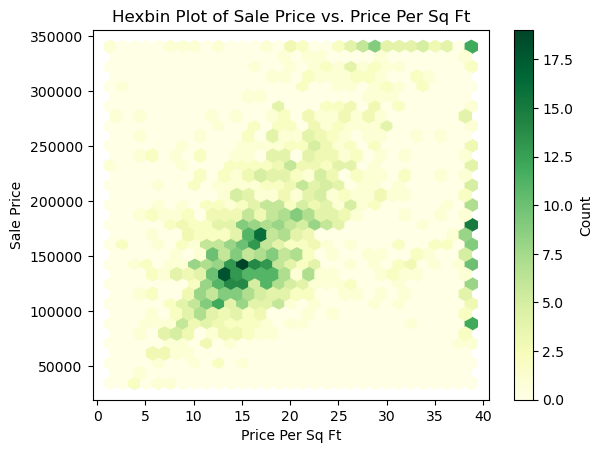

In [61]:
plt.hexbin(df4['PricePerSqFt'], df4['SalePrice'], gridsize=30, cmap='YlGn')
plt.colorbar(label='Count')
plt.xlabel('Price Per Sq Ft')
plt.ylabel('Sale Price')
plt.title('Hexbin Plot of Sale Price vs. Price Per Sq Ft')
plt.show()


# Insights

Concentration of Data Points: Most properties fall within the Price Per Sq Ft range of 10 to 25 and Sale Price range of 100,000 to 250,000.

Highest Density: The highest density of data points is around a Price Per Sq Ft of 15 to 20 and a Sale Price of 150,000 to 200,000.

Fewer High-Price Properties: There are fewer properties with a Price Per Sq Ft above 30 and Sale Price above 300,000, as indicated by the lighter color and fewer hexagons in these regions.

Positive Correlation: The data suggests a positive correlation between Price Per Sq Ft and Sale Price, as higher prices per square foot generally correspond to higher sale prices.

Majority Pricing: The majority of properties are priced between 10 to 25 per square foot, with sale prices mostly between 100,000 to 250,000.

High-Price Properties: Properties with higher Price Per Sq Ft (above 30) are less common and tend to have higher sale prices, but they are not the majority in the market.

Positive Correlation: Higher Price Per Sq Ft generally corresponds to higher sale prices, indicating a positive correlation.

### Street vs SalePrice

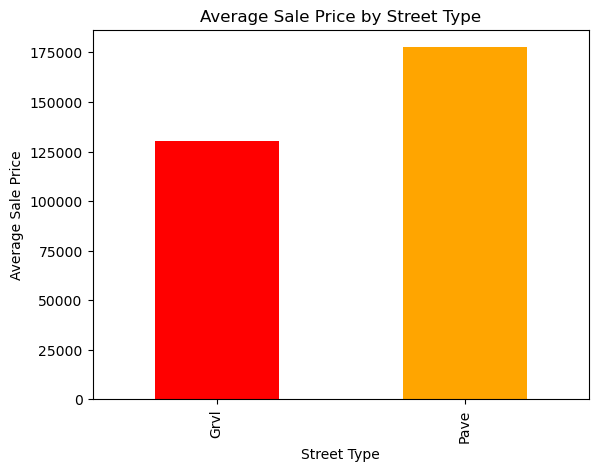

In [62]:
average_prices = df4.groupby('Street')['SalePrice'].mean()
average_prices.plot(kind='bar', color=['red', 'orange'])
plt.xlabel('Street Type')
plt.ylabel('Average Sale Price')
plt.title('Average Sale Price by Street Type')
plt.show()


# Insights 

Higher Average Sale Price on Paved Streets: Properties on Paved streets  have a significantly higher average sale price (approximately 175,000) compared to those on Gravel streets , which have an average sale price of around 125,000.

Street Type Impact: The type of street access clearly impacts property values, with paved streets being more desirable and fetching higher prices.

Paved Streets: Properties on paved streets are more in demand and have higher market value. This is likely due to better accessibility, convenience, and infrastructure associated with paved streets.

For potential buyers and investors, properties on paved streets could be considered a better investment due to their higher average sale prices and potential for greater appreciation.

Areas with paved streets may see more urban development and growth, attracting more buyers and leading to higher property values over time.

### Condition vs SalePrice

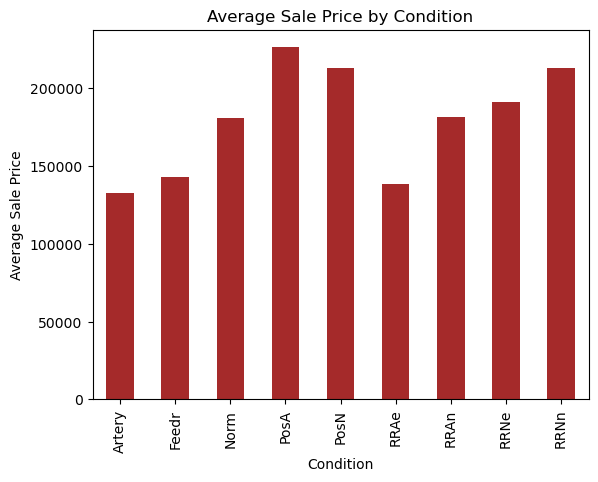

In [63]:
average_condition_prices = df4.groupby('Condition')['SalePrice'].mean()
average_condition_prices.plot(kind='bar', color='brown')
plt.xlabel('Condition')
plt.ylabel('Average Sale Price')
plt.title('Average Sale Price by Condition')
plt.show()

# Insights 

Market Segmentation: Properties in neighborhoods classified as PosA and PosN form a distinct segment of higher-value real estate. These areas might attract higher-income buyers and potentially more luxurious developments.

Price Sensitivity: Properties in conditions like Feedr and RRAe might be more price-sensitive to market fluctuations due to their relatively lower desirability. These areas could be more affected by economic changes or shifts in buyer preferences.

Urban Planning: Insights from this data can be used by urban planners to improve living conditions and property values. For instance, increasing green spaces and reducing high-traffic areas could boost overall property values.

Investment Focus: Investors might focus on properties in PosA and PosN conditions for higher returns. Conversely, they could consider improving properties in Feedr and RRAe conditions to increase their market value.

Development Strategy: Developers can use this data to strategize development projects. For example, focusing on areas near positive features (parks, lakes, etc.) for new projects or enhancements.

Buyer Behavior: Understanding that buyers are willing to pay a premium for properties in positive conditions can influence marketing strategies and sales tactics. Emphasizing proximity to desirable features can attract more buyers.

Increasing Demand for PosA/PosN: As urban areas grow, the demand for properties in PosA and PosN conditions is likely to increase, pushing property values higher.

Improvement Projects: Initiatives to improve conditions in areas like Feedr and RRAe could result in rising property values. Noise reduction measures, better infrastructure, and enhanced green spaces can make these areas more attractive.

Smart Investments: Investors and developers may increasingly target areas that show potential for improvement and growth. This strategy can lead to higher appreciation rates and better returns on investment.

Market Stabilization: Over time, areas currently in less favorable conditions might see stabilization and growth as infrastructure and amenities improve, leading to a more balanced market.

### House Price Trends Over Time

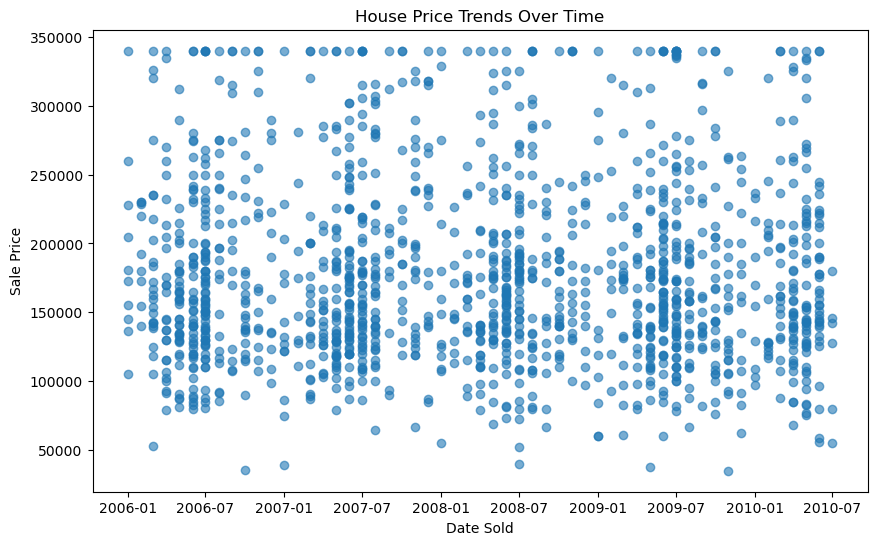

In [64]:
plt.figure(figsize=(10, 6))
plt.scatter(df4['MoYrSold'], df4['SalePrice'], alpha=0.6,marker='o',)
plt.title('House Price Trends Over Time')
plt.xlabel('Date Sold')
plt.ylabel('Sale Price')
plt.show()

# Insights

Price Distribution:

The sale prices are widely distributed, with a significant number of sales occurring between 100,000 and 200,000.

There are notable clusters of sales around 250,000 and 300,000.

Seasonal Patterns:

There appear to be seasonal patterns in the data, with denser clusters of sales occurring around mid-year (July) for each year from 2006 to 2010.

Market Stability:

The overall distribution of sale prices does not show a clear upward or downward trend over the time period, suggesting relative stability in the housing market during these years.

Mid-Year Spikes:

There are visible spikes in house sales around the middle of each year, which might indicate a trend where more people buy or sell houses during the summer months.

Stable Market:

The house prices appear relatively stable over the observed period, with no drastic changes in price trends. This suggests a balanced market without extreme volatility.

### Price Per Square Foot Trends Over Time

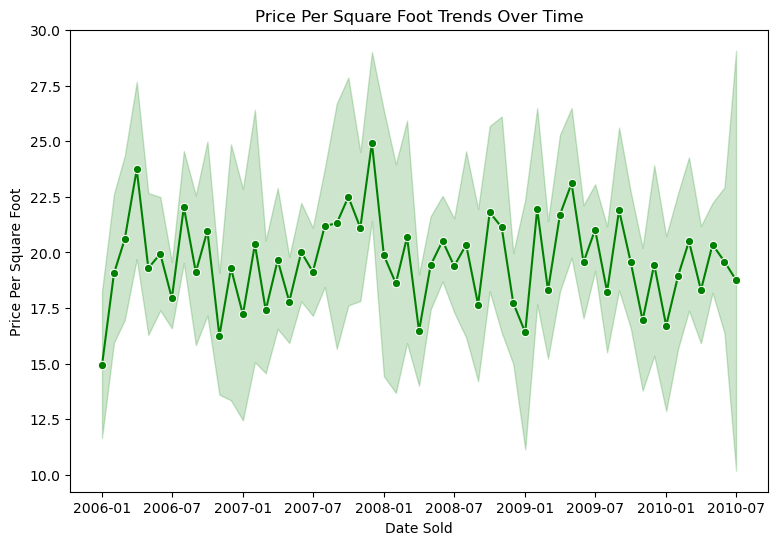

In [65]:
plt.figure(figsize=(9, 6))
sns.lineplot(x='MoYrSold', y='PricePerSqFt', data=df4, marker='o', color='green')
plt.title('Price Per Square Foot Trends Over Time')
plt.xlabel('Date Sold')
plt.ylabel('Price Per Square Foot')
plt.show()

# Insights

Fluctuations in Price Per Square Foot:

The price per square foot shows significant fluctuations over the period from January 2006 to July 2010.

There are noticeable peaks around mid-2006, early 2008, and mid-2010, indicating periods where prices were higher.

There seems to be a recurring pattern where prices per square foot rise and fall in cycles, possibly reflecting seasonal demand in the housing market.

The price per square foot generally stays within the range of 15 to 25, with some peaks and troughs indicating variability.

The market shows a cyclical nature, with periods of rising and falling prices, likely influenced by various economic factors, seasonality, and consumer behavior.

Periods of High Demand:

Peaks in the price per square foot during certain periods (mid-2006, early 2008, mid-2010) may indicate times of higher demand or reduced supply.



### MoYrSold vs TotalSF

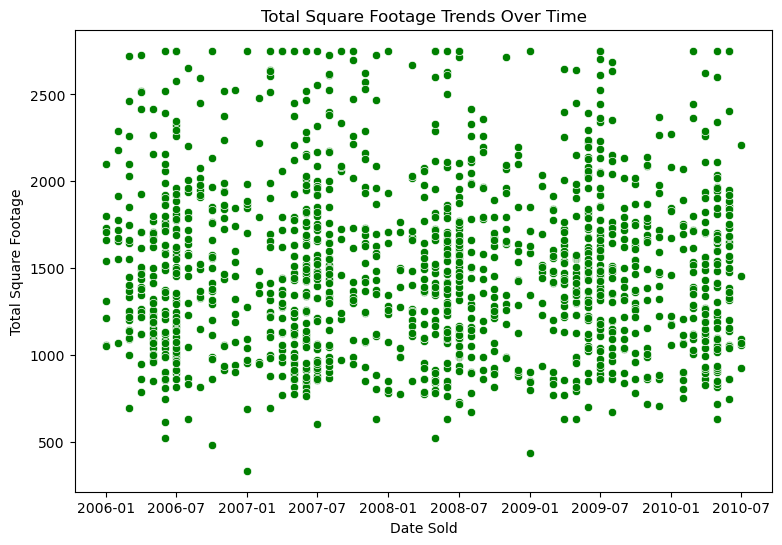

In [66]:
plt.figure(figsize=(9, 6))
sns.scatterplot(x='MoYrSold', y='TotalSF', data=df4, marker='o', color='green')
plt.title('Total Square Footage Trends Over Time')
plt.xlabel('Date Sold')
plt.ylabel('Total Square Footage')
plt.show()

# Insights 

Distribution of Square Footage:

The data points represent the total square footage of properties sold over the period from January 2006 to July 2010.

Stable Market Demand:

The lack of a clear trend indicates that buyers' preferences for property sizes remained consistent from 2006 to 2010.

This stability suggests a balanced market without significant shifts in demand for larger or smaller properties.



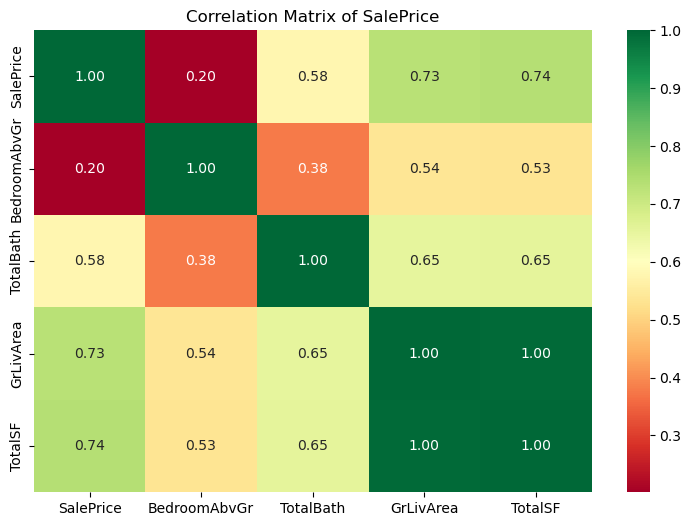

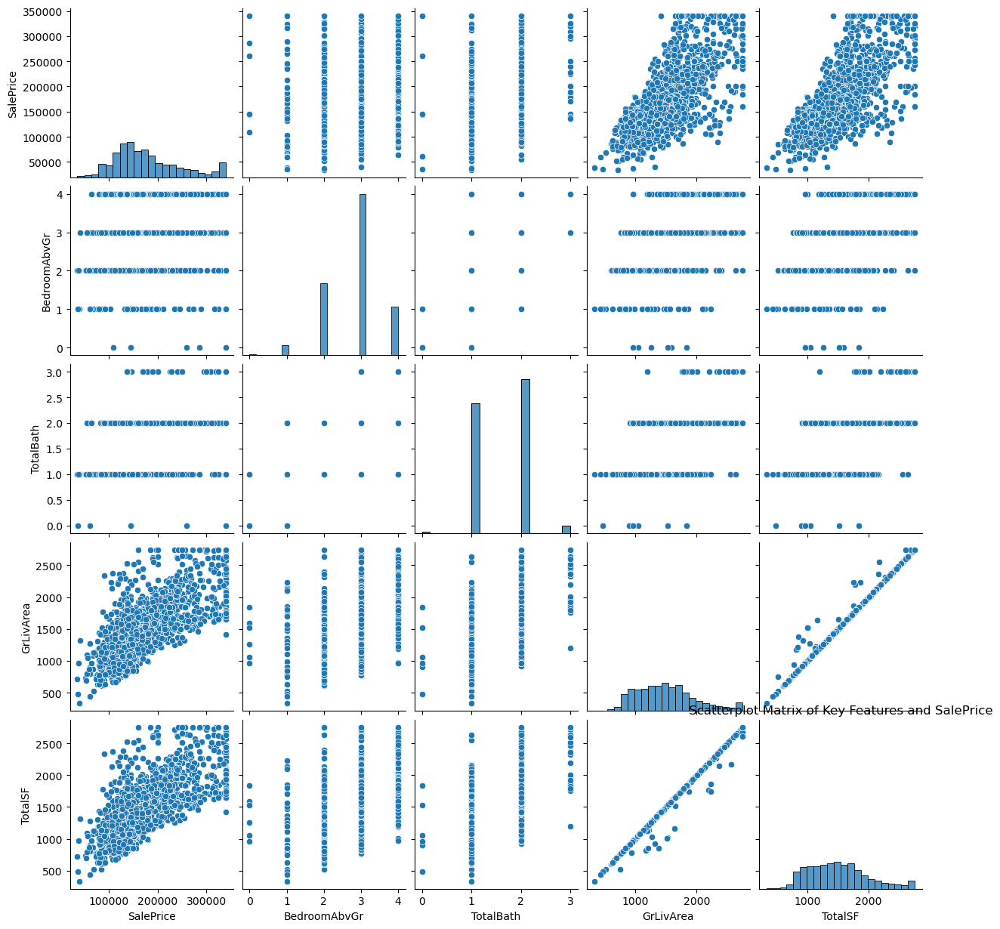

In [67]:
key_features = ['SalePrice', 'BedroomAbvGr', 'TotalBath', 'GrLivArea', 'TotalSF']

correlation_matrix = df4[key_features].corr()
plt.figure(figsize=(9, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='RdYlGn', fmt='.2f')
plt.title('Correlation Matrix of SalePrice')
plt.show()
sns.pairplot(df4[key_features])
plt.title('Scatterplot Matrix of Key Features and SalePrice')
plt.show()

# Insights of Heatmap

SalePrice and TotalSF: There is a strong positive correlation (0.74) between SalePrice and TotalSF, indicating that houses with larger total square footage tend to have higher sale prices.

SalePrice and GrLivArea: Similarly, there is a strong positive correlation (0.73) between SalePrice and GrLivArea, suggesting that larger living areas are associated with higher sale prices.

SalePrice and TotalBath: There is a moderate positive correlation (0.58) between SalePrice and TotalBath, indicating that houses with more bathrooms tend to have higher sale prices.

SalePrice and BedroomAbvGr: The correlation between SalePrice and BedroomAbvGr is relatively weak (0.20), suggesting that the number of bedrooms above ground has a minimal impact on sale price.

TotalSF and GrLivArea: These two features have a perfect positive correlation (1.00) with each other, indicating that they are essentially measuring the same aspect of the property.

TotalBath and Other Features: TotalBath has a moderate positive correlation with both GrLivArea (0.65) and TotalSF (0.65), suggesting that properties with more bathrooms tend to have larger living areas and total square footage.

# Insights of Pairplot

SalePrice vs. GrLivArea and TotalSF: There is a strong positive correlation between SalePrice and both GrLivArea (above-ground living area) and TotalSF (total square footage). This suggests that larger homes tend to have higher sale prices.

SalePrice vs. BedroomAbvGr and TotalBath: There is a weaker correlation between SalePrice and the number of bedrooms above ground (BedroomAbvGr) or the total number of bathrooms (TotalBath). This indicates that these features may not significantly impact the sale price compared to living area and total square footage.

GrLivArea vs. TotalSF: There is a strong positive correlation between GrLivArea and TotalSF, which is expected as both metrics measure the size of the home.

Distributions of Variables: The histograms on the diagonal show the distribution of each variable:

SalePrice: Right-skewed distribution, indicating that most homes are priced lower with a few high-priced outliers.

GrLivArea and TotalSF: Both have right-skewed distributions, meaning there are more smaller homes with fewer large ones.

BedroomAbvGr and TotalBath: More discrete distributions with fewer unique values.

### sale Price vs. Living Area (Clustered)

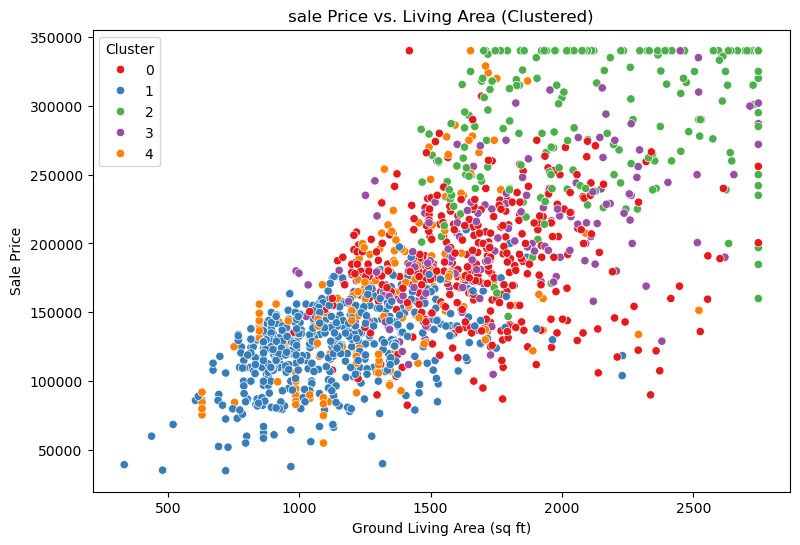

In [68]:
features = df4[['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBath']]

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(scaled_features)
visualization_df = df4.copy()
visualization_df['Cluster'] = kmeans.labels_

plt.figure(figsize=(9, 6))
sns.scatterplot(x='GrLivArea', y='SalePrice', hue='Cluster', data=visualization_df, palette='Set1')
plt.title('sale Price vs. Living Area (Clustered)')
plt.xlabel('Ground Living Area (sq ft)')
plt.ylabel('Sale Price')
plt.show()

# Insights 

Positive Correlation: As expected, there’s a positive correlation between the ground living area (GrLivArea) and sale price (SalePrice). This indicates that houses with larger living areas generally have higher sale prices.

Cluster Insights:

Cluster 0 (Blue): Houses in this cluster seem to have smaller living areas and lower prices. This could represent more affordable or compact housing options.

Cluster 1 (Orange): These houses have moderately larger living areas and slightly higher prices compared to Cluster 0.

Cluster 2 (Green): This cluster features houses with larger living areas and a noticeable increase in sale price, indicating a higher-end market segment.

Cluster 3 (Red): These houses also have larger living areas but appear to span a wider range of sale prices, possibly indicating variability in other amenities or location desirability.

Cluster 4 (Purple): Houses in this cluster have the largest livAffordable Housing: For clusters with smaller living areas and lower prices, focus on cost-efficiency and essential amenities.

Mid-Range Market: For clusters in the middle range, emphasize value for money with a balance of amenities and space.

# Correlation

In [69]:
table = df4.groupby(['Neighborhood'],as_index=False)['SalePrice'].median()
table = table.sort_values(by='SalePrice',ascending=False)
table.style.background_gradient(cmap='Reds')

,Neighborhood,SalePrice
16,NridgHt,315000.000000
15,NoRidge,301500.000000
22,StoneBr,278000.000000
23,Timber,228475.000000
21,Somerst,225500.000000
24,Veenker,218000.000000
6,Crawfor,200624.000000
4,ClearCr,200250.000000
5,CollgCr,197200.000000
0,Blmngtn,191000.000000


In [70]:
corr=df4.select_dtypes(include='number').corr()

In [71]:
corr

,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,PricePerSqFt,HouseAge,TotalSF,BsmtTotalBath,TotalBath
MSSubClass,1.000000,-0.229314,-0.403400,0.062802,0.055790,0.034654,-0.132786,-0.251190,0.098237,-0.062776,NaN,0.044963,-0.029120,0.100472,-0.019661,-0.085827,-0.009879,0.001883,-0.061456,0.476530,-0.055790,0.096419,-0.000292,0.161053
LotFrontage,-0.229314,1.000000,0.235964,0.167934,0.034966,0.082607,0.172428,0.203190,0.176639,0.153064,NaN,0.209693,0.023746,0.043345,0.169188,0.190861,-0.010906,0.067333,0.195989,-0.120467,-0.034966,0.175818,-0.009245,0.118089
LotArea,-0.403400,0.235964,1.000000,0.221599,0.065767,0.144063,0.087060,0.361770,0.433871,0.304171,NaN,0.395018,0.351998,0.013237,0.310164,0.344645,0.198310,0.162026,0.435878,-0.568378,-0.065767,0.437263,0.117505,0.217419
OverallQual,0.062802,0.167934,0.221599,1.000000,0.575160,0.414212,0.301683,0.541432,0.597218,0.122008,NaN,0.435768,0.396809,0.516129,0.609159,0.568185,0.246423,0.358426,0.817680,0.493229,-0.575160,0.603273,0.113989,0.542564
YearBuilt,0.055790,0.034966,0.065767,0.575160,1.000000,0.346139,0.145222,0.410450,0.214644,-0.044731,NaN,0.106356,0.148330,0.779092,0.546705,0.487446,0.238377,0.262130,0.570327,0.467125,-1.000000,0.227394,0.189255,0.467079
MasVnrArea,0.034654,0.082607,0.144063,0.414212,0.346139,1.000000,0.108650,0.355433,0.361053,0.132066,NaN,0.281214,0.251165,0.262771,0.386003,0.384189,0.161898,0.172860,0.450725,0.260855,-0.346139,0.367205,0.099915,0.279630
BsmtUnfSF,-0.132786,0.172428,0.087060,0.301683,0.145222,0.108650,1.000000,0.427651,0.245849,0.163970,NaN,0.253432,0.050528,0.181543,0.211099,0.178473,-0.010010,0.150551,0.215986,0.092183,-0.145222,0.244617,-0.427121,0.284139
TotalBsmtSF,-0.251190,0.203190,0.361770,0.541432,0.410450,0.355433,0.427651,1.000000,0.404359,0.046413,NaN,0.271000,0.328147,0.320361,0.461365,0.485658,0.241778,0.249657,0.645251,0.197755,-0.410450,0.409557,0.304917,0.330619
GrLivArea,0.098237,0.176639,0.433871,0.597218,0.214644,0.361053,0.245849,0.404359,1.000000,0.536243,NaN,0.835194,0.462469,0.225161,0.487803,0.471376,0.243034,0.347630,0.729315,0.208026,-0.214644,0.996505,0.020353,0.651363
BedroomAbvGr,-0.062776,0.153064,0.304171,0.122008,-0.044731,0.132066,0.163970,0.046413,0.536243,1.000000,NaN,0.663199,0.127991,-0.052767,0.107451,0.092968,0.054826,0.102232,0.201854,-0.153707,0.044731,0.534541,-0.158467,0.376771


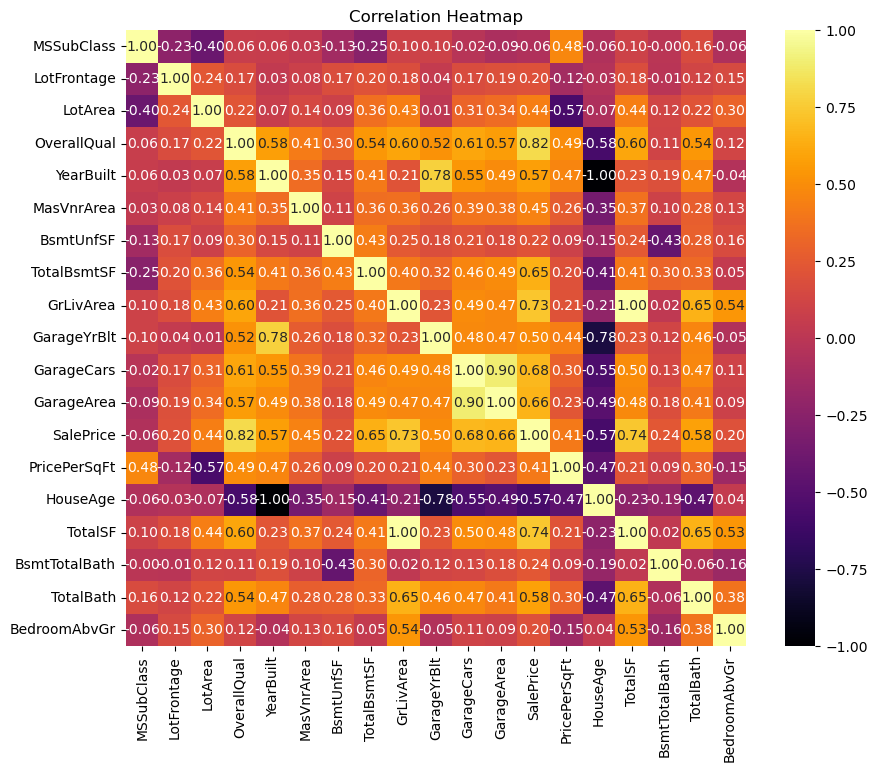

In [72]:
heatmap_data = df4[['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'MasVnrArea', 'BsmtUnfSF','TotalBsmtSF','GrLivArea','GarageYrBlt','GarageCars','GarageArea','SalePrice','PricePerSqFt','HouseAge','TotalSF','BsmtTotalBath','TotalBath','BedroomAbvGr']]

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data.corr(), annot=True, cmap='inferno', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

# Insights

OverallQual:

Significantly impacts SalePrice (0.82 correlation). Better overall quality tends to increase house prices.

GrLivArea (Above Ground Living Area):

Strongly correlated with SalePrice (0.73). Larger living areas generally command higher prices.

TotalSF (Total Square Feet):

Strongly correlated with SalePrice (0.76). Larger houses are valued more.

TotalBath (Total Bathrooms):

Moderate correlation with SalePrice (0.56). More bathrooms can positively affect the house price.

HouseAge:

Negatively correlated with SalePrice (-0.30). Newer houses are typically priced higher.

Garage:

GarageCars has a moderate correlation with SalePrice (0.63). Houses with larger garages tend to have higher prices.

GarageArea also shows a similar trend.

YearRemodAdd (Year Remodeled):

Moderate positive correlation with SalePrice (0.57). Recently remodeled houses are often priced higher.

LotArea:

Weak correlation with SalePrice (0.26). Lot size has some impact on house prices, but it’s not as significant as other factors.

PricePerSqFt:

Provides an understanding of value independent of house size. Can be a useful metric for comparing different houses.

FullBath:

Moderate correlation with SalePrice (0.56). More full bathrooms generally increase the house's value.


In [89]:
features = ['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Neighborhood', 'OverallQual', 'YearBuilt', 'GarageCars']
target = 'SalePrice'

categorical_features = [col for col in features if df4[col].dtype == 'object']
numerical_features = [col for col in features if df4[col].dtype in ['int64', 'float64']]

print("Numerical Features:", numerical_features)
print("Categorical Features:", categorical_features)

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2, include_bias=False)) 
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ],
    remainder='passthrough'
)

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge())  
])

X = df4[features]
y = df4[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

kf = KFold(n_splits=5, shuffle=True, random_state=42)  
cv_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(-cv_scores) 
print("Cross-validation RMSE scores:", cv_rmse_scores)
print("Mean cross-validation RMSE:", cv_rmse_scores.mean())

model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
predictions_df4 = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print("\nPredictions:")
print(predictions_df4)

predictions_df4.to_csv('predictions.csv', index=False)


Numerical Features: ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'GarageCars']
Categorical Features: ['MSZoning', 'Street', 'Neighborhood']
Cross-validation RMSE scores: [29595.0809804  29070.87958165 29487.19516599 28810.33956704
 29984.14176201]
Mean cross-validation RMSE: 29389.527411416355
Mean Squared Error: 769408544.0656791
R-squared: 0.8426326023514454

Predictions:
        Actual      Predicted
892   154500.0  137283.647973
1105  325000.0  270507.010790
413   115000.0  124309.534952
522   159000.0  140878.227517
1036  315500.0  311801.686598
614    75500.0   96170.015723
218   311500.0  251981.024067
1160  146000.0  133556.880121
649    84500.0   96844.217236
887   135500.0  142920.172066
576   145000.0  162670.602855
1252  130000.0  124828.924167
1061   81000.0  136415.720177
567   214000.0  241023.847570
1108  181000.0  173638.914197
1113  134500.0  122739.993374
168   183500.0  196709.253423
1102  135000.0  119334.723803
1120  118400.0  121596.176285

In [91]:
df4.to_csv('final-File.csv', index=False)